In [1]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
from PIL import Image
import time
import glob
import imageio
from IPython import display
import cv2
import pathlib
import zipfile
import torch
import sys
import pandas as pd 

import torchvision
import torch.nn as nn
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader, ConcatDataset, TensorDataset
from torchvision.utils import make_grid
import torch.optim as optim
from torchvision.datasets import MNIST

from skimage import io, transform
from torchsummary import summary
from torchviz import make_dot, make_dot_from_trace

c:\Users\dagam\AppData\Local\Programs\Python\Python311\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# Decide which device we want to run on
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda', index=0)

In [3]:
class Generator(nn.Module):

    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()

        self.gen = nn.Sequential(
            self.get_generator_block(z_dim, hidden_dim),
            self.get_generator_block(hidden_dim, hidden_dim * 2),
            self.get_generator_block(hidden_dim * 2, hidden_dim * 4),
            self.get_generator_block(hidden_dim * 4, hidden_dim * 8),

            nn.Linear(hidden_dim * 8, im_dim),
            nn.Sigmoid()

        )
    def get_generator_block(self, input_dim, output_dim):
        return nn.Sequential(
            nn.Linear(input_dim, output_dim),
            nn.BatchNorm1d(output_dim),
            nn.ReLU(inplace=True),
        )
    
    def forward(self, noise):
        return self.gen(noise)
    
summary(Generator(64).to(device) , (64,))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1                  [-1, 128]           8,320
       BatchNorm1d-2                  [-1, 128]             256
              ReLU-3                  [-1, 128]               0
            Linear-4                  [-1, 256]          33,024
       BatchNorm1d-5                  [-1, 256]             512
              ReLU-6                  [-1, 256]               0
            Linear-7                  [-1, 512]         131,584
       BatchNorm1d-8                  [-1, 512]           1,024
              ReLU-9                  [-1, 512]               0
           Linear-10                 [-1, 1024]         525,312
      BatchNorm1d-11                 [-1, 1024]           2,048
             ReLU-12                 [-1, 1024]               0
           Linear-13                  [-1, 784]         803,600
          Sigmoid-14                  [

In [4]:
class Discriminator(nn.Module):

    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            self.get_discriminator_block(im_dim, hidden_dim * 4),
            self.get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            self.get_discriminator_block(hidden_dim * 2, hidden_dim),

            nn.Linear(hidden_dim, 1)

        )
    def get_discriminator_block(self, input_dim, output_dim):
        return nn.Sequential(
             nn.Linear(input_dim, output_dim), 
             nn.LeakyReLU(0.2, inplace=True)
        )
    def forward(self, image):
        return self.disc(image)
    
summary(Discriminator().to(device) , (28*28,))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1                  [-1, 512]         401,920
         LeakyReLU-2                  [-1, 512]               0
            Linear-3                  [-1, 256]         131,328
         LeakyReLU-4                  [-1, 256]               0
            Linear-5                  [-1, 128]          32,896
         LeakyReLU-6                  [-1, 128]               0
            Linear-7                    [-1, 1]             129
Total params: 566,273
Trainable params: 566,273
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.01
Params size (MB): 2.16
Estimated Total Size (MB): 2.18
----------------------------------------------------------------


In [5]:
def get_noise(n_samples, z_dim, device='cpu'):
    return torch.randn(n_samples,z_dim,device=device)

In [6]:
z_dim = 64
batch_size = 128

fixed_noise = get_noise(batch_size, z_dim, device=device)

train_transform = transforms.Compose([
    transforms.ToTensor(),
])

dataloader = DataLoader(
    MNIST('data', download=True, transform=train_transform),
    batch_size=batch_size,
    shuffle=True)

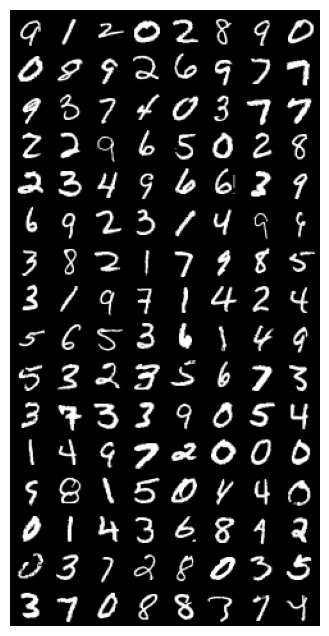

In [7]:
for images, labels in dataloader:
    plt.figure(figsize=(8,8))
    plt.axis('off')
    plt.imshow(make_grid(images, nrow=8).permute((1, 2, 0)))
    break

In [8]:
lr = 0.00001

criterion = nn.BCEWithLogitsLoss()

gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)

disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

In [9]:
def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28), show_fig=False, epoch=0):
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.axis('off')
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    if show_fig:
        plt.savefig('images/image_at_epoch_{:04d}.png'.format(epoch))
        
    plt.show()

Epoch: 0/200 Steps:469	Epoch_Run_Time: 8.997569	Loss_D : 0.312155	Loss_G : 1.708478	
Epoch: 0/200 Total Steps:469	Total_Time : 8.999575
Loss_D : 0.312155	Loss_G : 1.708478
Loss_D_Mean : 0.421346	Loss_G_Mean : 1.353031


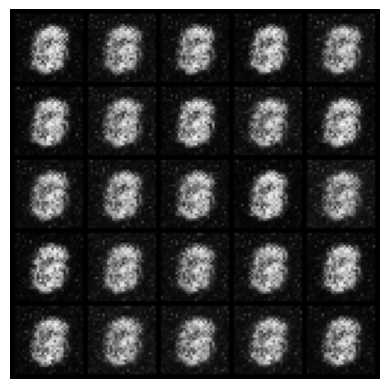

Epoch: 1/200 Steps:469	Epoch_Run_Time: 9.010278	Loss_D : 0.213284	Loss_G : 1.923226	
Epoch: 1/200 Total Steps:938	Total_Time : 18.136987
Loss_D : 0.213284	Loss_G : 1.923226
Loss_D_Mean : 0.290610	Loss_G_Mean : 1.710301


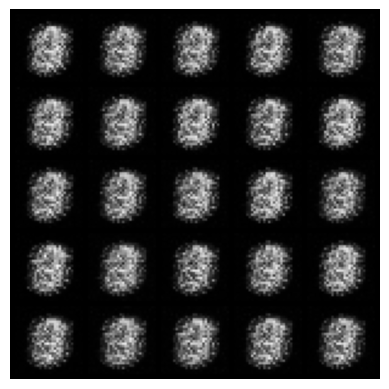

Epoch: 2/200 Steps:469	Epoch_Run_Time: 9.049411	Loss_D : 0.154810	Loss_G : 2.046393	
Epoch: 2/200 Total Steps:1407	Total_Time : 27.286184
Loss_D : 0.154810	Loss_G : 2.046393
Loss_D_Mean : 0.173191	Loss_G_Mean : 2.002989


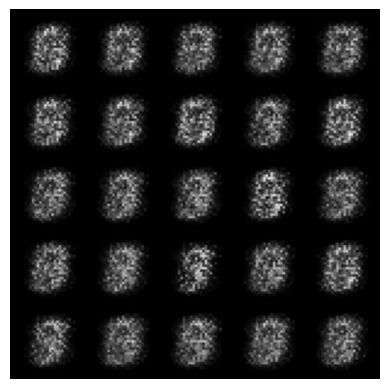

Epoch: 3/200 Steps:469	Epoch_Run_Time: 9.117129	Loss_D : 0.230676	Loss_G : 1.687451	
Epoch: 3/200 Total Steps:1876	Total_Time : 36.510322
Loss_D : 0.230676	Loss_G : 1.687451
Loss_D_Mean : 0.201630	Loss_G_Mean : 1.783492


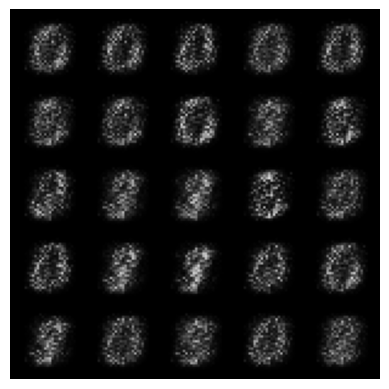

Epoch: 4/200 Steps:469	Epoch_Run_Time: 9.053215	Loss_D : 0.183225	Loss_G : 1.822098	
Epoch: 4/200 Total Steps:2345	Total_Time : 45.660055
Loss_D : 0.183225	Loss_G : 1.822098
Loss_D_Mean : 0.193793	Loss_G_Mean : 1.748349


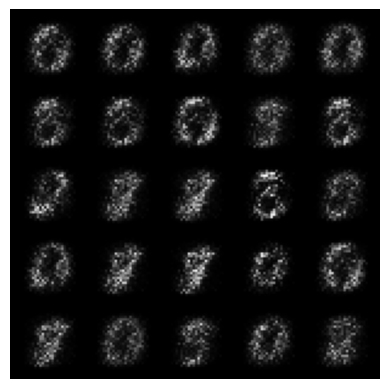

Epoch: 5/200 Steps:469	Epoch_Run_Time: 9.037438	Loss_D : 0.162918	Loss_G : 1.915124	
Epoch: 5/200 Total Steps:2814	Total_Time : 54.793493
Loss_D : 0.162918	Loss_G : 1.915124
Loss_D_Mean : 0.174570	Loss_G_Mean : 1.900736


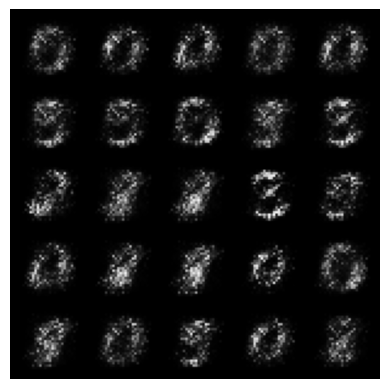

Epoch: 6/200 Steps:469	Epoch_Run_Time: 8.998339	Loss_D : 0.131985	Loss_G : 2.259593	
Epoch: 6/200 Total Steps:3283	Total_Time : 63.889194
Loss_D : 0.131985	Loss_G : 2.259593
Loss_D_Mean : 0.150596	Loss_G_Mean : 2.247895


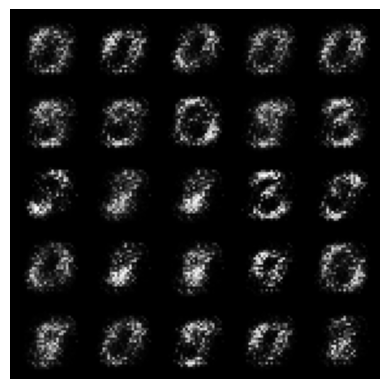

Epoch: 7/200 Steps:469	Epoch_Run_Time: 9.030596	Loss_D : 0.104673	Loss_G : 2.603464	
Epoch: 7/200 Total Steps:3752	Total_Time : 73.018463
Loss_D : 0.104673	Loss_G : 2.603464
Loss_D_Mean : 0.138436	Loss_G_Mean : 2.519161


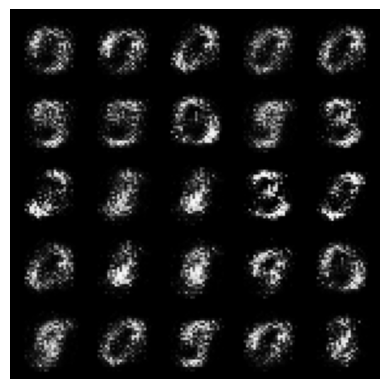

Epoch: 8/200 Steps:469	Epoch_Run_Time: 9.062108	Loss_D : 0.072468	Loss_G : 2.906838	
Epoch: 8/200 Total Steps:4221	Total_Time : 82.181383
Loss_D : 0.072468	Loss_G : 2.906838
Loss_D_Mean : 0.113672	Loss_G_Mean : 2.851846


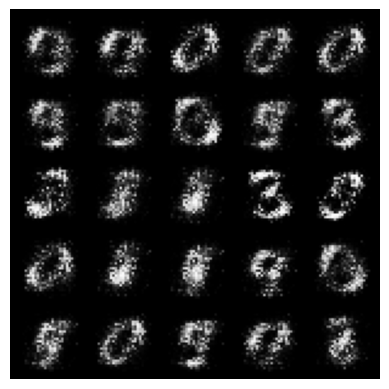

Epoch: 9/200 Steps:469	Epoch_Run_Time: 9.050283	Loss_D : 0.077753	Loss_G : 3.411792	
Epoch: 9/200 Total Steps:4690	Total_Time : 91.333521
Loss_D : 0.077753	Loss_G : 3.411792
Loss_D_Mean : 0.093981	Loss_G_Mean : 3.149908


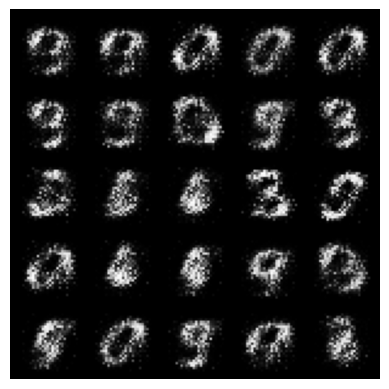

Epoch: 10/200 Steps:469	Epoch_Run_Time: 9.026304	Loss_D : 0.055937	Loss_G : 3.856489	
Epoch: 10/200 Total Steps:5159	Total_Time : 100.455558
Loss_D : 0.055937	Loss_G : 3.856489
Loss_D_Mean : 0.071386	Loss_G_Mean : 3.468554


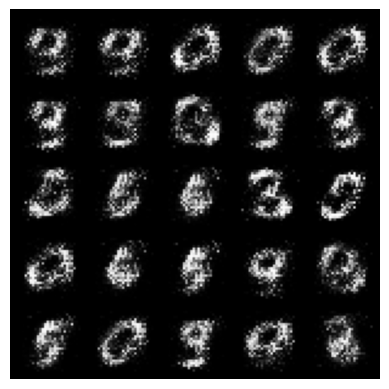

Epoch: 11/200 Steps:469	Epoch_Run_Time: 9.033697	Loss_D : 0.056222	Loss_G : 3.537462	
Epoch: 11/200 Total Steps:5628	Total_Time : 109.590074
Loss_D : 0.056222	Loss_G : 3.537462
Loss_D_Mean : 0.064722	Loss_G_Mean : 3.809174


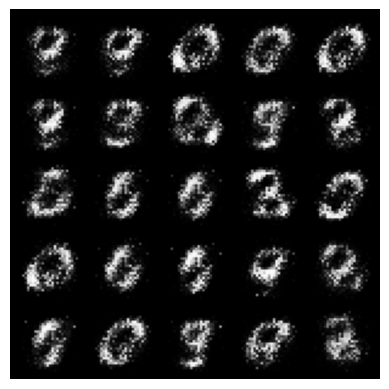

Epoch: 12/200 Steps:469	Epoch_Run_Time: 9.056497	Loss_D : 0.040592	Loss_G : 4.159628	
Epoch: 12/200 Total Steps:6097	Total_Time : 118.743658
Loss_D : 0.040592	Loss_G : 4.159628
Loss_D_Mean : 0.061396	Loss_G_Mean : 3.744609


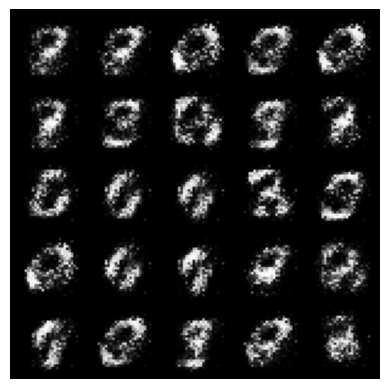

Epoch: 13/200 Steps:469	Epoch_Run_Time: 9.002431	Loss_D : 0.048159	Loss_G : 4.167652	
Epoch: 13/200 Total Steps:6566	Total_Time : 127.850346
Loss_D : 0.048159	Loss_G : 4.167652
Loss_D_Mean : 0.054721	Loss_G_Mean : 4.092843


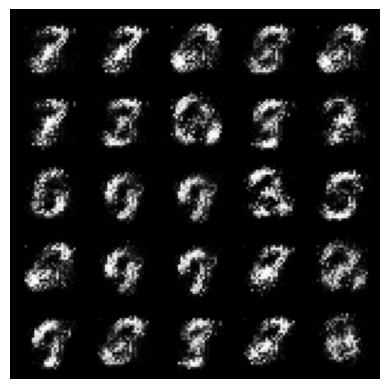

Epoch: 14/200 Steps:469	Epoch_Run_Time: 9.011894	Loss_D : 0.048813	Loss_G : 4.295902	
Epoch: 14/200 Total Steps:7035	Total_Time : 136.955982
Loss_D : 0.048813	Loss_G : 4.295902
Loss_D_Mean : 0.050535	Loss_G_Mean : 4.189357


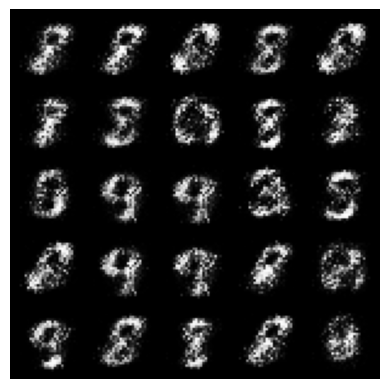

Epoch: 15/200 Steps:469	Epoch_Run_Time: 8.994709	Loss_D : 0.036651	Loss_G : 3.800513	
Epoch: 15/200 Total Steps:7504	Total_Time : 146.036280
Loss_D : 0.036651	Loss_G : 3.800513
Loss_D_Mean : 0.060095	Loss_G_Mean : 4.074115


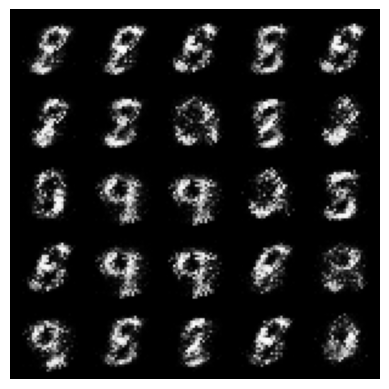

Epoch: 16/200 Steps:469	Epoch_Run_Time: 8.881028	Loss_D : 0.070378	Loss_G : 4.013556	
Epoch: 16/200 Total Steps:7973	Total_Time : 155.010486
Loss_D : 0.070378	Loss_G : 4.013556
Loss_D_Mean : 0.064722	Loss_G_Mean : 3.921735


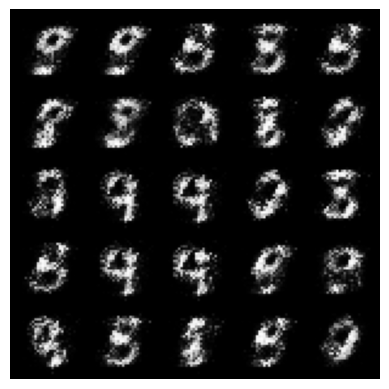

Epoch: 17/200 Steps:469	Epoch_Run_Time: 8.978552	Loss_D : 0.068762	Loss_G : 3.943257	
Epoch: 17/200 Total Steps:8442	Total_Time : 164.086304
Loss_D : 0.068762	Loss_G : 3.943257
Loss_D_Mean : 0.062315	Loss_G_Mean : 4.037613


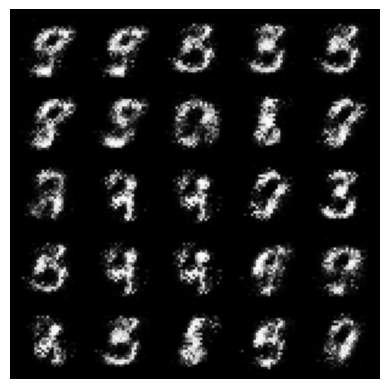

Epoch: 18/200 Steps:469	Epoch_Run_Time: 8.995337	Loss_D : 0.054427	Loss_G : 4.062847	
Epoch: 18/200 Total Steps:8911	Total_Time : 173.168874
Loss_D : 0.054427	Loss_G : 4.062847
Loss_D_Mean : 0.057972	Loss_G_Mean : 4.062274


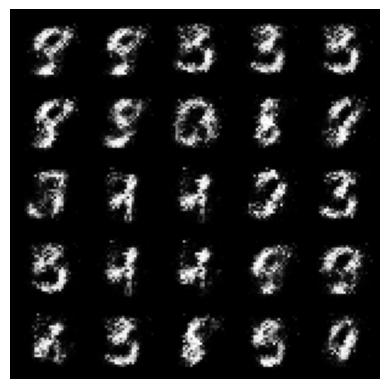

Epoch: 19/200 Steps:469	Epoch_Run_Time: 8.998488	Loss_D : 0.055793	Loss_G : 3.851421	
Epoch: 19/200 Total Steps:9380	Total_Time : 182.250226
Loss_D : 0.055793	Loss_G : 3.851421
Loss_D_Mean : 0.056266	Loss_G_Mean : 4.218364


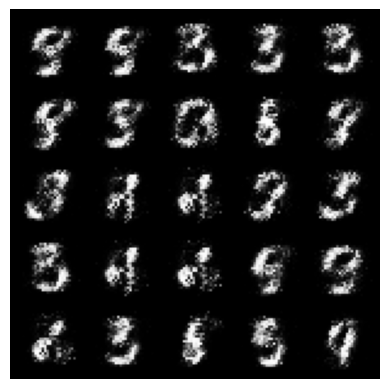

Epoch: 20/200 Steps:469	Epoch_Run_Time: 8.998124	Loss_D : 0.048290	Loss_G : 4.005170	
Epoch: 20/200 Total Steps:9849	Total_Time : 191.339477
Loss_D : 0.048290	Loss_G : 4.005170
Loss_D_Mean : 0.058380	Loss_G_Mean : 4.311623


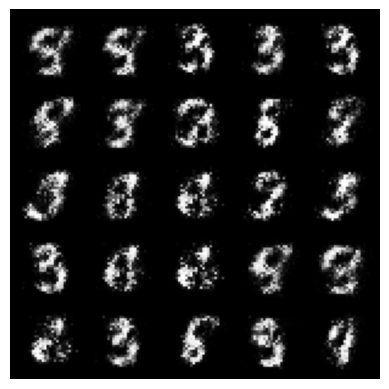

Epoch: 21/200 Steps:469	Epoch_Run_Time: 8.966556	Loss_D : 0.064288	Loss_G : 3.945607	
Epoch: 21/200 Total Steps:10318	Total_Time : 200.392846
Loss_D : 0.064288	Loss_G : 3.945607
Loss_D_Mean : 0.075145	Loss_G_Mean : 4.168359


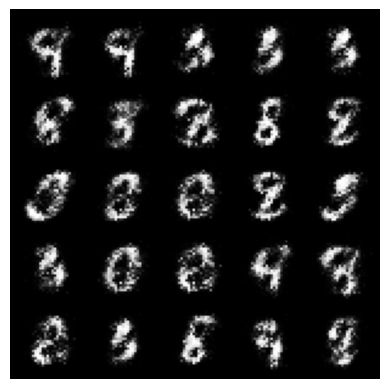

Epoch: 22/200 Steps:469	Epoch_Run_Time: 9.184065	Loss_D : 0.063920	Loss_G : 4.120840	
Epoch: 22/200 Total Steps:10787	Total_Time : 209.665663
Loss_D : 0.063920	Loss_G : 4.120840
Loss_D_Mean : 0.074664	Loss_G_Mean : 3.984882


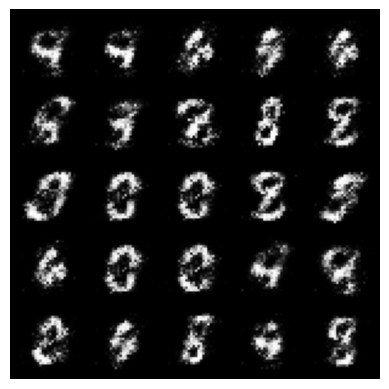

Epoch: 23/200 Steps:469	Epoch_Run_Time: 9.061430	Loss_D : 0.058604	Loss_G : 3.791783	
Epoch: 23/200 Total Steps:11256	Total_Time : 218.816301
Loss_D : 0.058604	Loss_G : 3.791783
Loss_D_Mean : 0.077350	Loss_G_Mean : 3.905729


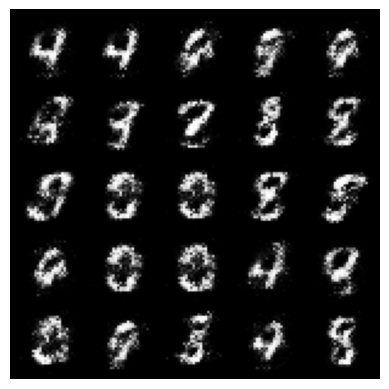

Epoch: 24/200 Steps:469	Epoch_Run_Time: 8.821853	Loss_D : 0.066781	Loss_G : 4.217009	
Epoch: 24/200 Total Steps:11725	Total_Time : 227.723947
Loss_D : 0.066781	Loss_G : 4.217009
Loss_D_Mean : 0.071267	Loss_G_Mean : 3.938809


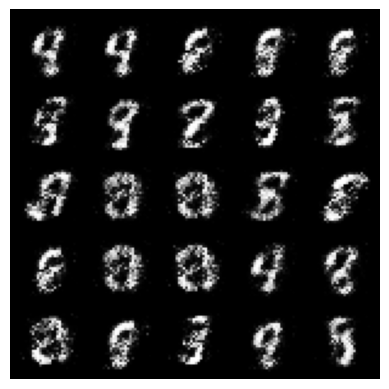

Epoch: 25/200 Steps:469	Epoch_Run_Time: 8.720567	Loss_D : 0.070312	Loss_G : 3.630370	
Epoch: 25/200 Total Steps:12194	Total_Time : 236.536250
Loss_D : 0.070312	Loss_G : 3.630370
Loss_D_Mean : 0.081139	Loss_G_Mean : 3.974338


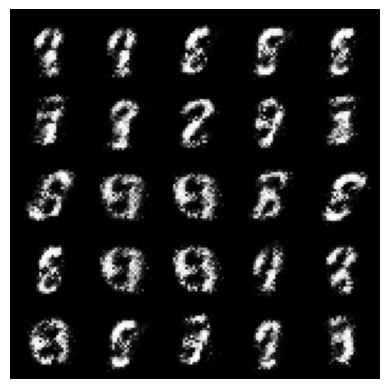

Epoch: 26/200 Steps:469	Epoch_Run_Time: 8.700696	Loss_D : 0.077046	Loss_G : 3.528083	
Epoch: 26/200 Total Steps:12663	Total_Time : 245.316815
Loss_D : 0.077046	Loss_G : 3.528083
Loss_D_Mean : 0.083169	Loss_G_Mean : 3.835896


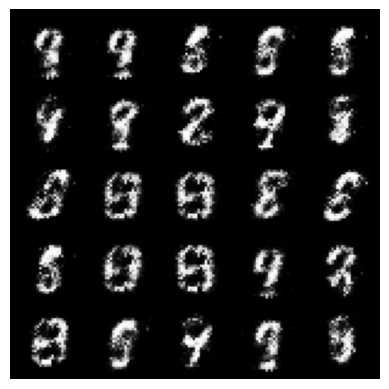

Epoch: 27/200 Steps:469	Epoch_Run_Time: 8.677809	Loss_D : 0.102312	Loss_G : 3.906154	
Epoch: 27/200 Total Steps:13132	Total_Time : 254.077333
Loss_D : 0.102312	Loss_G : 3.906154
Loss_D_Mean : 0.089323	Loss_G_Mean : 3.973500


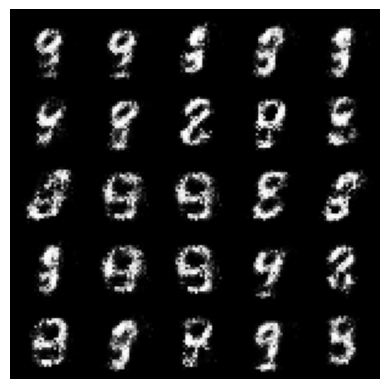

Epoch: 28/200 Steps:469	Epoch_Run_Time: 8.706622	Loss_D : 0.081057	Loss_G : 3.373515	
Epoch: 28/200 Total Steps:13601	Total_Time : 262.862657
Loss_D : 0.081057	Loss_G : 3.373515
Loss_D_Mean : 0.100088	Loss_G_Mean : 3.826573


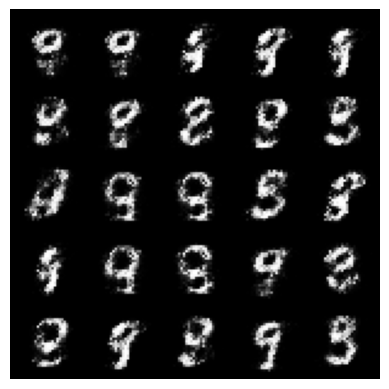

Epoch: 29/200 Steps:469	Epoch_Run_Time: 8.726809	Loss_D : 0.092024	Loss_G : 3.890491	
Epoch: 29/200 Total Steps:14070	Total_Time : 271.678193
Loss_D : 0.092024	Loss_G : 3.890491
Loss_D_Mean : 0.094486	Loss_G_Mean : 3.859811


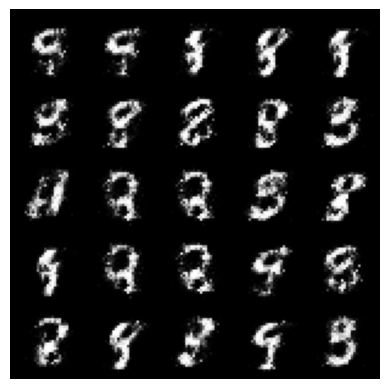

Epoch: 30/200 Steps:469	Epoch_Run_Time: 8.716976	Loss_D : 0.072484	Loss_G : 4.201362	
Epoch: 30/200 Total Steps:14539	Total_Time : 280.474872
Loss_D : 0.072484	Loss_G : 4.201362
Loss_D_Mean : 0.093716	Loss_G_Mean : 3.866712


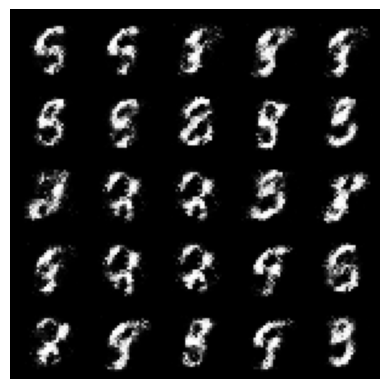

Epoch: 31/200 Steps:469	Epoch_Run_Time: 8.715931	Loss_D : 0.140724	Loss_G : 3.806600	
Epoch: 31/200 Total Steps:15008	Total_Time : 289.267431
Loss_D : 0.140724	Loss_G : 3.806600
Loss_D_Mean : 0.123571	Loss_G_Mean : 3.748679


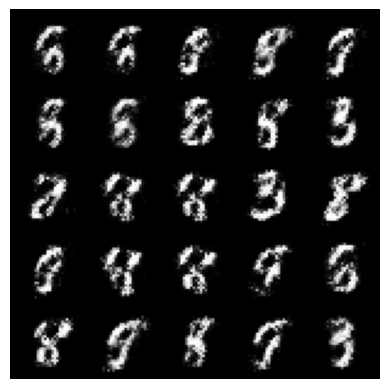

Epoch: 32/200 Steps:469	Epoch_Run_Time: 8.684447	Loss_D : 0.138336	Loss_G : 3.616791	
Epoch: 32/200 Total Steps:15477	Total_Time : 298.027123
Loss_D : 0.138336	Loss_G : 3.616791
Loss_D_Mean : 0.127892	Loss_G_Mean : 3.615295


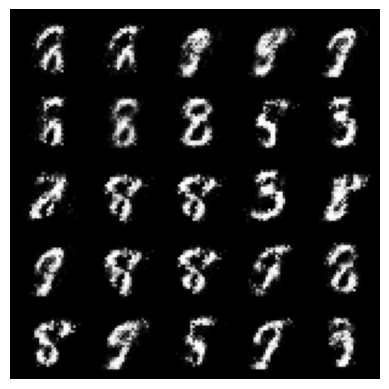

Epoch: 33/200 Steps:469	Epoch_Run_Time: 8.669365	Loss_D : 0.116904	Loss_G : 3.288289	
Epoch: 33/200 Total Steps:15946	Total_Time : 306.785292
Loss_D : 0.116904	Loss_G : 3.288289
Loss_D_Mean : 0.113017	Loss_G_Mean : 3.644772


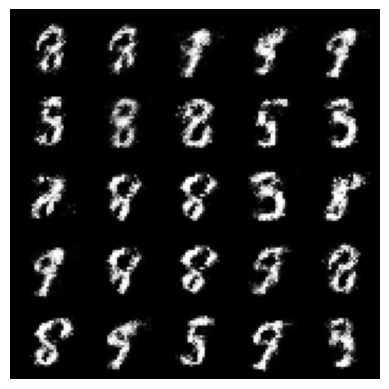

Epoch: 34/200 Steps:469	Epoch_Run_Time: 8.710103	Loss_D : 0.047376	Loss_G : 3.955027	
Epoch: 34/200 Total Steps:16415	Total_Time : 315.578175
Loss_D : 0.047376	Loss_G : 3.955027
Loss_D_Mean : 0.106426	Loss_G_Mean : 3.691470


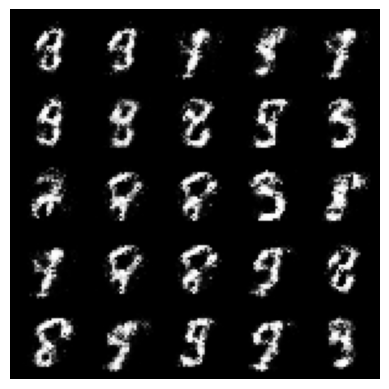

Epoch: 35/200 Steps:469	Epoch_Run_Time: 8.725764	Loss_D : 0.179295	Loss_G : 4.039639	
Epoch: 35/200 Total Steps:16884	Total_Time : 324.389321
Loss_D : 0.179295	Loss_G : 4.039639
Loss_D_Mean : 0.116122	Loss_G_Mean : 3.872501


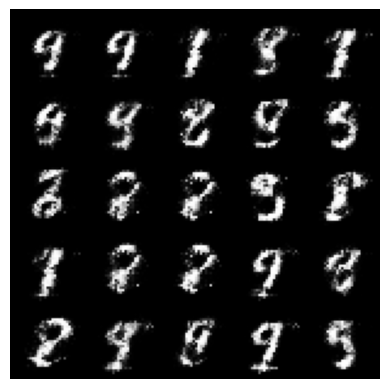

Epoch: 36/200 Steps:469	Epoch_Run_Time: 8.666861	Loss_D : 0.092467	Loss_G : 3.737213	
Epoch: 36/200 Total Steps:17353	Total_Time : 333.136886
Loss_D : 0.092467	Loss_G : 3.737213
Loss_D_Mean : 0.147090	Loss_G_Mean : 3.535270


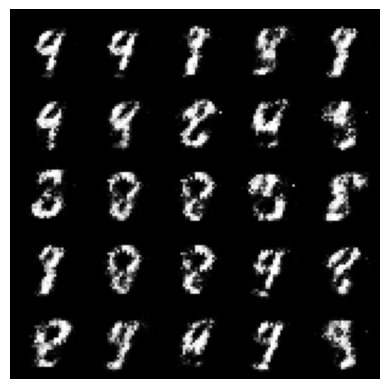

Epoch: 37/200 Steps:469	Epoch_Run_Time: 8.731658	Loss_D : 0.137809	Loss_G : 3.359109	
Epoch: 37/200 Total Steps:17822	Total_Time : 341.951254
Loss_D : 0.137809	Loss_G : 3.359109
Loss_D_Mean : 0.135530	Loss_G_Mean : 3.328831


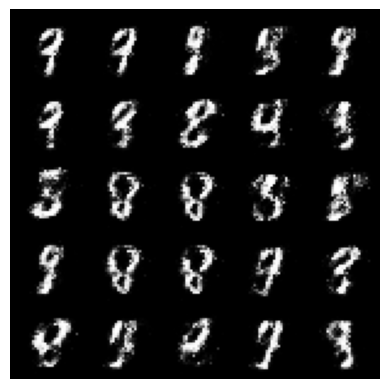

Epoch: 38/200 Steps:469	Epoch_Run_Time: 8.700161	Loss_D : 0.148635	Loss_G : 3.334190	
Epoch: 38/200 Total Steps:18291	Total_Time : 350.729112
Loss_D : 0.148635	Loss_G : 3.334190
Loss_D_Mean : 0.129850	Loss_G_Mean : 3.417251


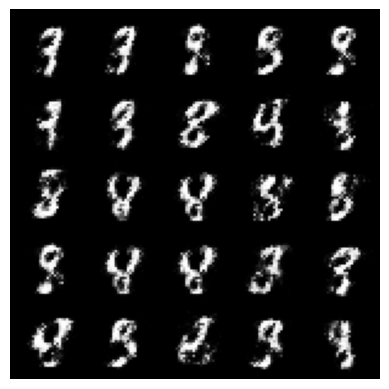

Epoch: 39/200 Steps:469	Epoch_Run_Time: 8.740382	Loss_D : 0.110742	Loss_G : 3.431231	
Epoch: 39/200 Total Steps:18760	Total_Time : 359.551202
Loss_D : 0.110742	Loss_G : 3.431231
Loss_D_Mean : 0.128030	Loss_G_Mean : 3.481364


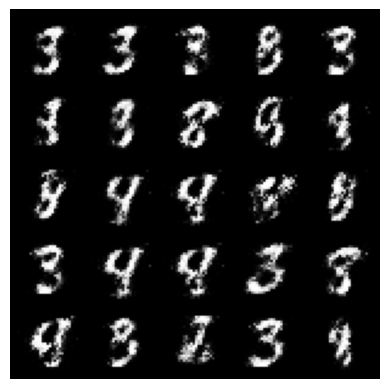

Epoch: 40/200 Steps:469	Epoch_Run_Time: 8.739942	Loss_D : 0.193728	Loss_G : 3.410143	
Epoch: 40/200 Total Steps:19229	Total_Time : 368.369842
Loss_D : 0.193728	Loss_G : 3.410143
Loss_D_Mean : 0.138631	Loss_G_Mean : 3.426080


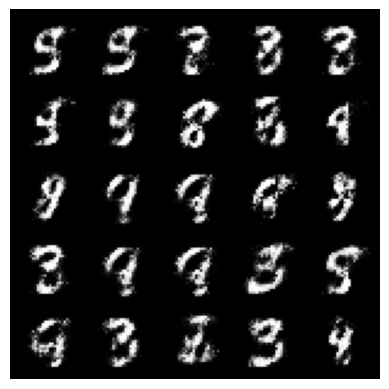

Epoch: 41/200 Steps:469	Epoch_Run_Time: 8.718312	Loss_D : 0.124483	Loss_G : 3.955859	
Epoch: 41/200 Total Steps:19698	Total_Time : 377.165106
Loss_D : 0.124483	Loss_G : 3.955859
Loss_D_Mean : 0.142857	Loss_G_Mean : 3.341222


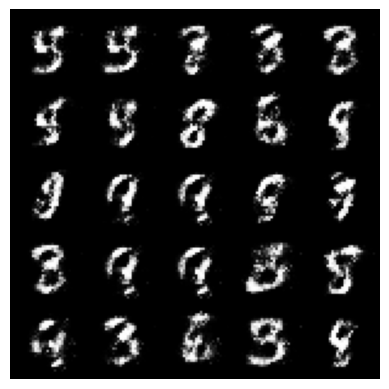

Epoch: 42/200 Steps:469	Epoch_Run_Time: 8.706238	Loss_D : 0.113260	Loss_G : 3.181069	
Epoch: 42/200 Total Steps:20167	Total_Time : 385.946210
Loss_D : 0.113260	Loss_G : 3.181069
Loss_D_Mean : 0.144868	Loss_G_Mean : 3.461768


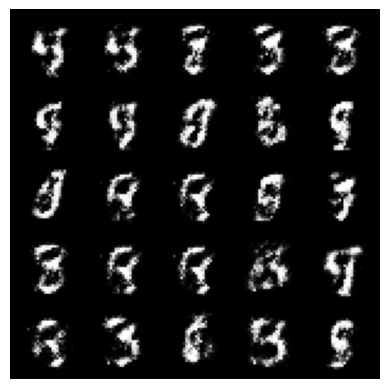

Epoch: 43/200 Steps:469	Epoch_Run_Time: 8.706194	Loss_D : 0.185745	Loss_G : 3.017151	
Epoch: 43/200 Total Steps:20636	Total_Time : 394.735116
Loss_D : 0.185745	Loss_G : 3.017151
Loss_D_Mean : 0.161102	Loss_G_Mean : 3.245488


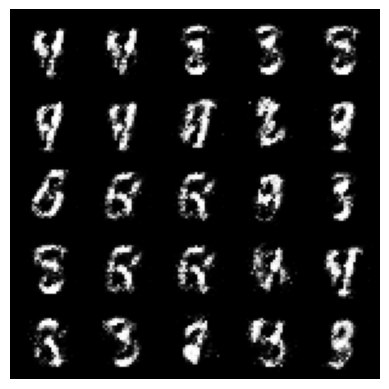

Epoch: 44/200 Steps:469	Epoch_Run_Time: 8.714046	Loss_D : 0.214327	Loss_G : 3.031495	
Epoch: 44/200 Total Steps:21105	Total_Time : 403.526859
Loss_D : 0.214327	Loss_G : 3.031495
Loss_D_Mean : 0.143584	Loss_G_Mean : 3.244272


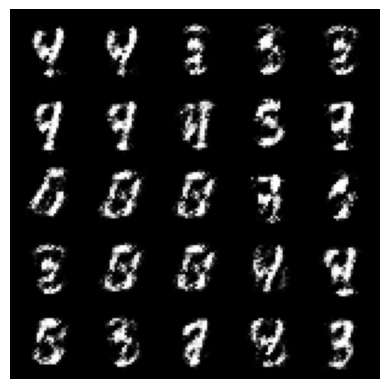

Epoch: 45/200 Steps:469	Epoch_Run_Time: 8.795363	Loss_D : 0.171725	Loss_G : 3.278212	
Epoch: 45/200 Total Steps:21574	Total_Time : 412.408189
Loss_D : 0.171725	Loss_G : 3.278212
Loss_D_Mean : 0.154223	Loss_G_Mean : 3.382020


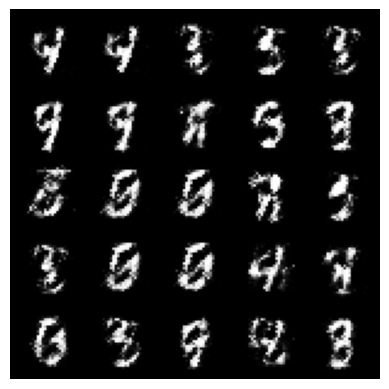

Epoch: 46/200 Steps:469	Epoch_Run_Time: 8.990903	Loss_D : 0.131821	Loss_G : 3.580995	
Epoch: 46/200 Total Steps:22043	Total_Time : 421.482770
Loss_D : 0.131821	Loss_G : 3.580995
Loss_D_Mean : 0.149152	Loss_G_Mean : 3.453564


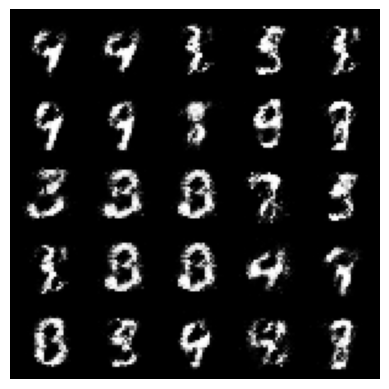

Epoch: 47/200 Steps:469	Epoch_Run_Time: 9.022740	Loss_D : 0.196176	Loss_G : 3.113242	
Epoch: 47/200 Total Steps:22512	Total_Time : 430.592322
Loss_D : 0.196176	Loss_G : 3.113242
Loss_D_Mean : 0.155821	Loss_G_Mean : 3.363652


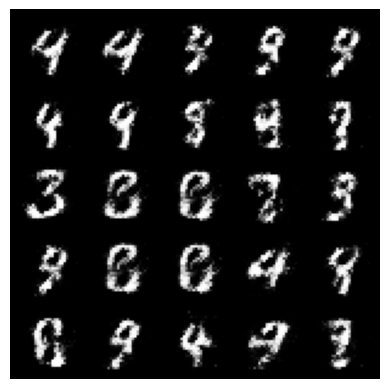

Epoch: 48/200 Steps:469	Epoch_Run_Time: 8.860843	Loss_D : 0.101098	Loss_G : 3.031343	
Epoch: 48/200 Total Steps:22981	Total_Time : 439.538170
Loss_D : 0.101098	Loss_G : 3.031343
Loss_D_Mean : 0.179035	Loss_G_Mean : 3.220020


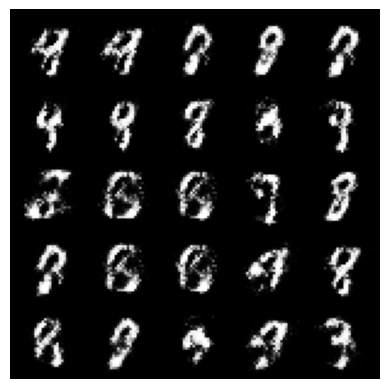

Epoch: 49/200 Steps:469	Epoch_Run_Time: 8.721057	Loss_D : 0.146660	Loss_G : 3.193680	
Epoch: 49/200 Total Steps:23450	Total_Time : 448.348211
Loss_D : 0.146660	Loss_G : 3.193680
Loss_D_Mean : 0.156474	Loss_G_Mean : 3.265467


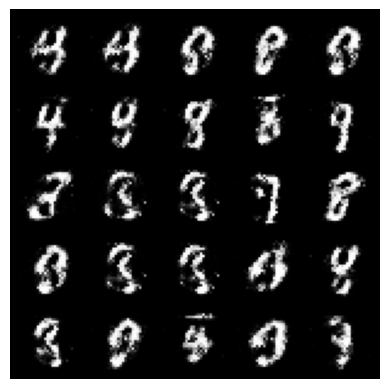

Epoch: 50/200 Steps:469	Epoch_Run_Time: 8.724544	Loss_D : 0.211241	Loss_G : 3.146614	
Epoch: 50/200 Total Steps:23919	Total_Time : 457.152347
Loss_D : 0.211241	Loss_G : 3.146614
Loss_D_Mean : 0.193363	Loss_G_Mean : 3.189515


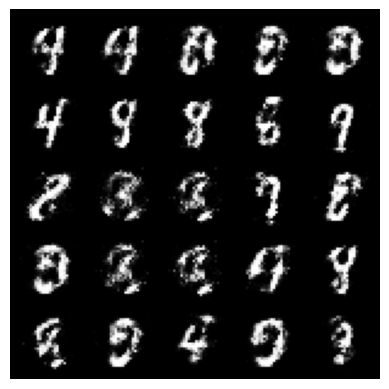

Epoch: 51/200 Steps:469	Epoch_Run_Time: 8.764286	Loss_D : 0.238082	Loss_G : 2.618927	
Epoch: 51/200 Total Steps:24388	Total_Time : 465.993478
Loss_D : 0.238082	Loss_G : 2.618927
Loss_D_Mean : 0.194751	Loss_G_Mean : 3.058988


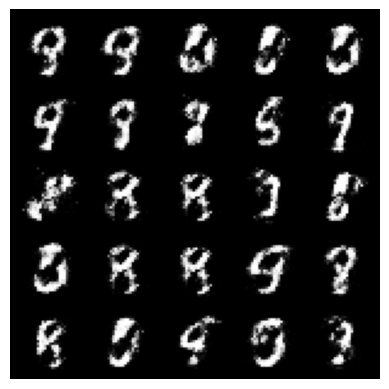

Epoch: 52/200 Steps:469	Epoch_Run_Time: 8.869403	Loss_D : 0.152636	Loss_G : 3.229287	
Epoch: 52/200 Total Steps:24857	Total_Time : 474.942583
Loss_D : 0.152636	Loss_G : 3.229287
Loss_D_Mean : 0.180984	Loss_G_Mean : 3.007805


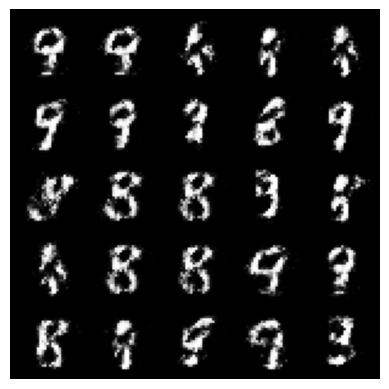

Epoch: 53/200 Steps:469	Epoch_Run_Time: 8.811370	Loss_D : 0.232822	Loss_G : 3.417104	
Epoch: 53/200 Total Steps:25326	Total_Time : 483.842683
Loss_D : 0.232822	Loss_G : 3.417104
Loss_D_Mean : 0.187600	Loss_G_Mean : 2.993093


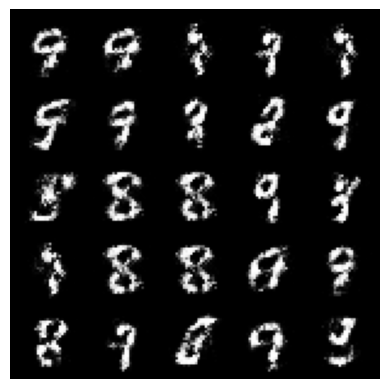

Epoch: 54/200 Steps:469	Epoch_Run_Time: 9.033465	Loss_D : 0.258563	Loss_G : 2.324731	
Epoch: 54/200 Total Steps:25795	Total_Time : 492.954701
Loss_D : 0.258563	Loss_G : 2.324731
Loss_D_Mean : 0.196777	Loss_G_Mean : 2.952223


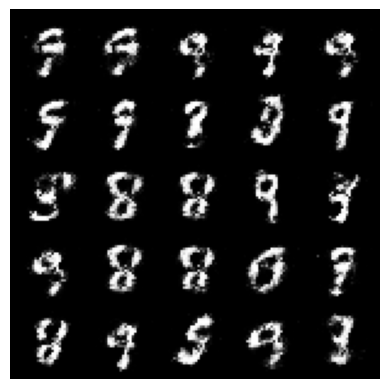

Epoch: 55/200 Steps:469	Epoch_Run_Time: 9.030588	Loss_D : 0.185437	Loss_G : 3.138430	
Epoch: 55/200 Total Steps:26264	Total_Time : 502.072014
Loss_D : 0.185437	Loss_G : 3.138430
Loss_D_Mean : 0.191178	Loss_G_Mean : 2.982145


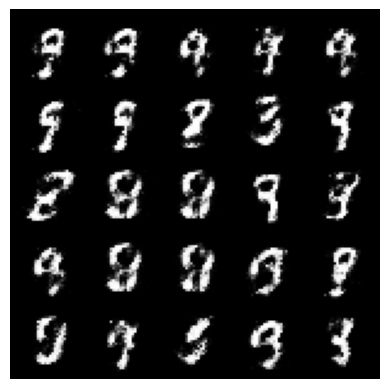

Epoch: 56/200 Steps:469	Epoch_Run_Time: 8.820586	Loss_D : 0.240237	Loss_G : 2.675339	
Epoch: 56/200 Total Steps:26733	Total_Time : 510.973658
Loss_D : 0.240237	Loss_G : 2.675339
Loss_D_Mean : 0.193267	Loss_G_Mean : 2.941542


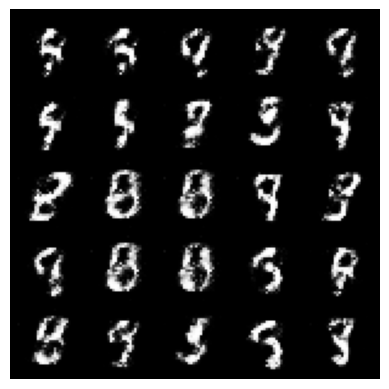

Epoch: 57/200 Steps:469	Epoch_Run_Time: 8.887765	Loss_D : 0.146121	Loss_G : 3.224710	
Epoch: 57/200 Total Steps:27202	Total_Time : 519.941412
Loss_D : 0.146121	Loss_G : 3.224710
Loss_D_Mean : 0.195380	Loss_G_Mean : 2.899082


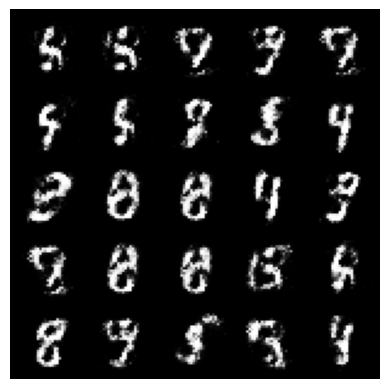

Epoch: 58/200 Steps:469	Epoch_Run_Time: 8.857255	Loss_D : 0.165193	Loss_G : 3.187469	
Epoch: 58/200 Total Steps:27671	Total_Time : 528.881009
Loss_D : 0.165193	Loss_G : 3.187469
Loss_D_Mean : 0.189827	Loss_G_Mean : 3.025031


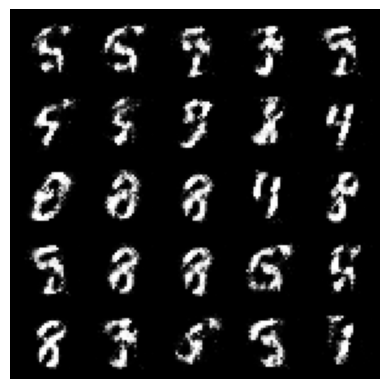

Epoch: 59/200 Steps:469	Epoch_Run_Time: 9.044127	Loss_D : 0.207501	Loss_G : 3.089569	
Epoch: 59/200 Total Steps:28140	Total_Time : 538.000826
Loss_D : 0.207501	Loss_G : 3.089569
Loss_D_Mean : 0.195349	Loss_G_Mean : 2.993838


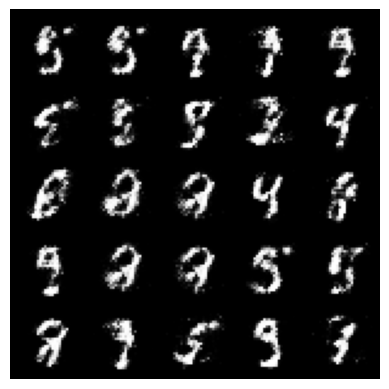

Epoch: 60/200 Steps:469	Epoch_Run_Time: 9.088459	Loss_D : 0.119455	Loss_G : 2.554666	
Epoch: 60/200 Total Steps:28609	Total_Time : 547.172182
Loss_D : 0.119455	Loss_G : 2.554666
Loss_D_Mean : 0.219845	Loss_G_Mean : 2.861645


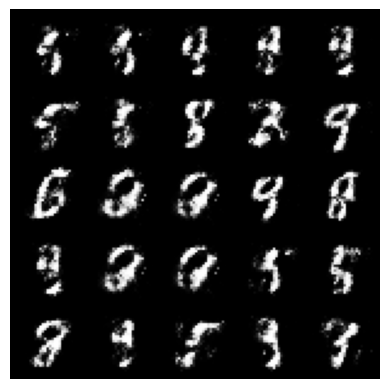

Epoch: 61/200 Steps:469	Epoch_Run_Time: 8.952765	Loss_D : 0.254183	Loss_G : 2.527086	
Epoch: 61/200 Total Steps:29078	Total_Time : 556.206156
Loss_D : 0.254183	Loss_G : 2.527086
Loss_D_Mean : 0.231311	Loss_G_Mean : 2.694353


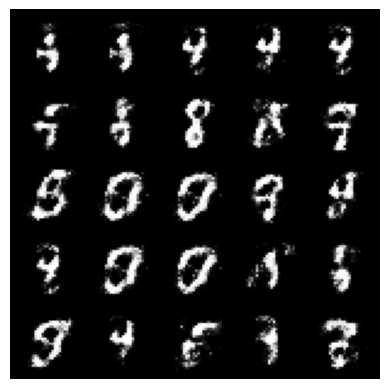

Epoch: 62/200 Steps:469	Epoch_Run_Time: 9.440691	Loss_D : 0.219271	Loss_G : 3.045189	
Epoch: 62/200 Total Steps:29547	Total_Time : 565.736723
Loss_D : 0.219271	Loss_G : 3.045189
Loss_D_Mean : 0.209195	Loss_G_Mean : 2.880637


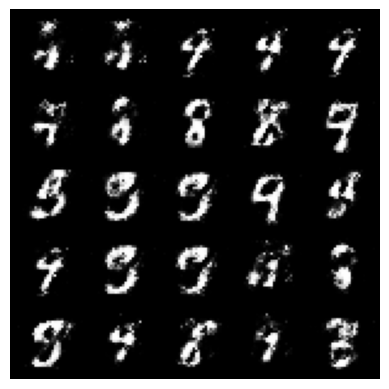

Epoch: 63/200 Steps:469	Epoch_Run_Time: 9.436239	Loss_D : 0.310808	Loss_G : 2.860193	
Epoch: 63/200 Total Steps:30016	Total_Time : 575.263314
Loss_D : 0.310808	Loss_G : 2.860193
Loss_D_Mean : 0.224128	Loss_G_Mean : 2.794403


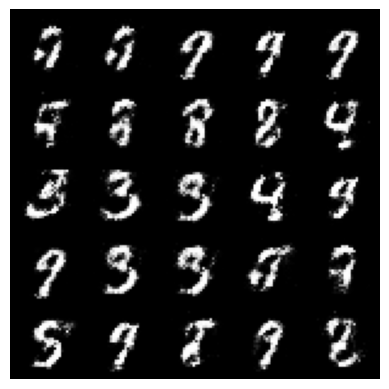

Epoch: 64/200 Steps:469	Epoch_Run_Time: 9.528979	Loss_D : 0.261026	Loss_G : 3.419789	
Epoch: 64/200 Total Steps:30485	Total_Time : 584.878308
Loss_D : 0.261026	Loss_G : 3.419789
Loss_D_Mean : 0.217989	Loss_G_Mean : 2.763963


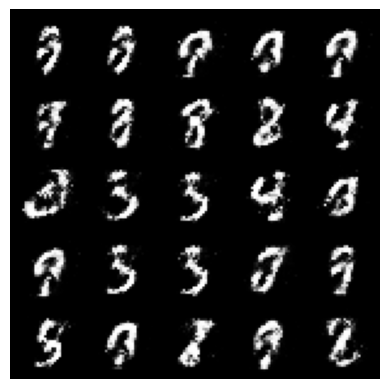

Epoch: 65/200 Steps:469	Epoch_Run_Time: 8.989468	Loss_D : 0.187186	Loss_G : 2.688447	
Epoch: 65/200 Total Steps:30954	Total_Time : 593.950537
Loss_D : 0.187186	Loss_G : 2.688447
Loss_D_Mean : 0.209630	Loss_G_Mean : 2.825289


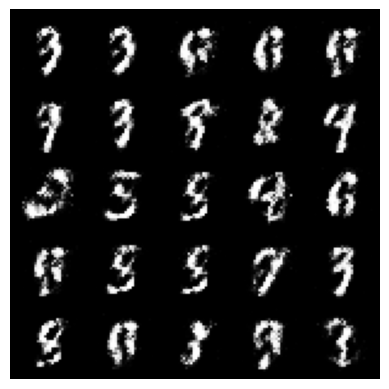

Epoch: 66/200 Steps:469	Epoch_Run_Time: 8.899649	Loss_D : 0.203264	Loss_G : 2.765375	
Epoch: 66/200 Total Steps:31423	Total_Time : 602.925337
Loss_D : 0.203264	Loss_G : 2.765375
Loss_D_Mean : 0.221790	Loss_G_Mean : 2.689636


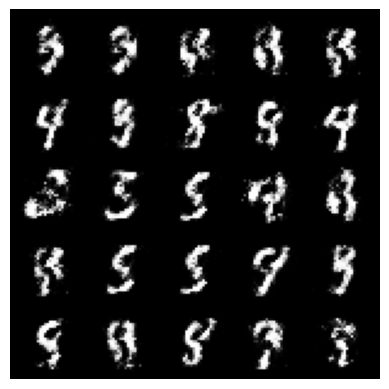

Epoch: 67/200 Steps:469	Epoch_Run_Time: 8.795640	Loss_D : 0.194695	Loss_G : 2.554792	
Epoch: 67/200 Total Steps:31892	Total_Time : 611.798229
Loss_D : 0.194695	Loss_G : 2.554792
Loss_D_Mean : 0.199286	Loss_G_Mean : 2.765952


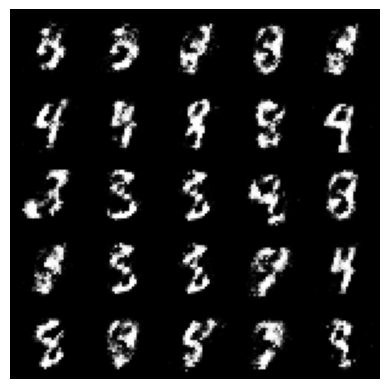

Epoch: 68/200 Steps:469	Epoch_Run_Time: 9.000012	Loss_D : 0.156069	Loss_G : 2.604465	
Epoch: 68/200 Total Steps:32361	Total_Time : 620.882460
Loss_D : 0.156069	Loss_G : 2.604465
Loss_D_Mean : 0.230596	Loss_G_Mean : 2.702403


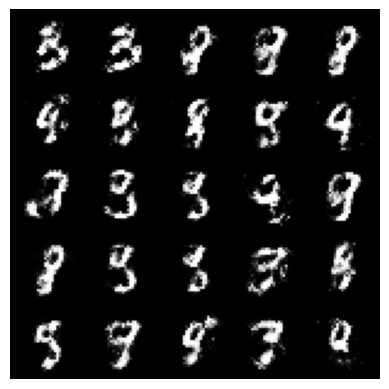

Epoch: 69/200 Steps:469	Epoch_Run_Time: 8.950638	Loss_D : 0.228338	Loss_G : 2.973917	
Epoch: 69/200 Total Steps:32830	Total_Time : 629.923689
Loss_D : 0.228338	Loss_G : 2.973917
Loss_D_Mean : 0.207751	Loss_G_Mean : 2.746119


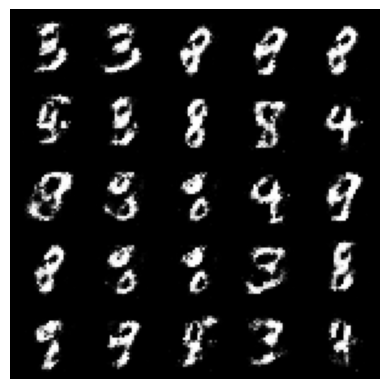

Epoch: 70/200 Steps:469	Epoch_Run_Time: 8.976459	Loss_D : 0.193669	Loss_G : 2.807478	
Epoch: 70/200 Total Steps:33299	Total_Time : 638.979622
Loss_D : 0.193669	Loss_G : 2.807478
Loss_D_Mean : 0.216656	Loss_G_Mean : 2.673442


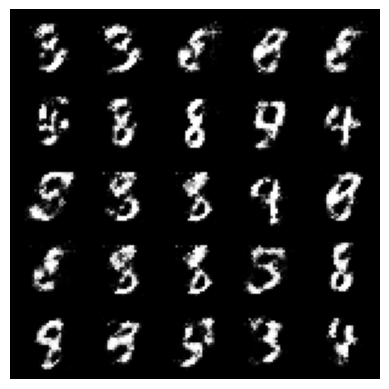

Epoch: 71/200 Steps:469	Epoch_Run_Time: 9.049431	Loss_D : 0.274842	Loss_G : 2.380209	
Epoch: 71/200 Total Steps:33768	Total_Time : 648.116080
Loss_D : 0.274842	Loss_G : 2.380209
Loss_D_Mean : 0.209074	Loss_G_Mean : 2.758377


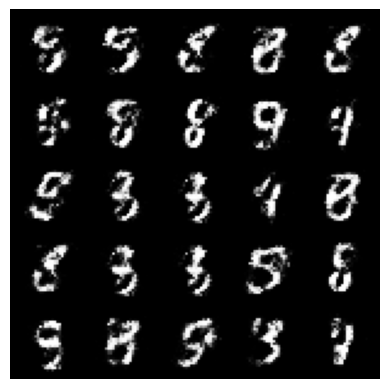

Epoch: 72/200 Steps:469	Epoch_Run_Time: 9.045505	Loss_D : 0.189980	Loss_G : 2.909304	
Epoch: 72/200 Total Steps:34237	Total_Time : 657.247931
Loss_D : 0.189980	Loss_G : 2.909304
Loss_D_Mean : 0.214535	Loss_G_Mean : 2.715393


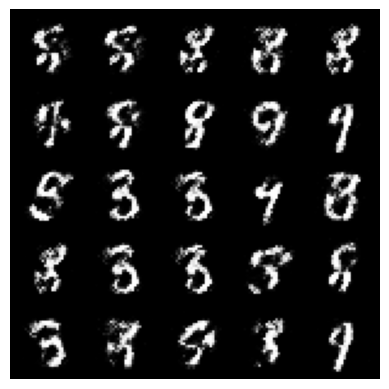

Epoch: 73/200 Steps:469	Epoch_Run_Time: 9.013871	Loss_D : 0.180550	Loss_G : 2.578008	
Epoch: 73/200 Total Steps:34706	Total_Time : 666.346370
Loss_D : 0.180550	Loss_G : 2.578008
Loss_D_Mean : 0.236406	Loss_G_Mean : 2.635413


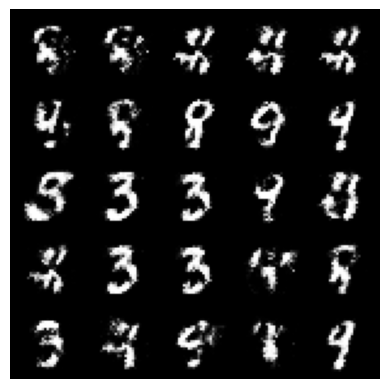

Epoch: 74/200 Steps:469	Epoch_Run_Time: 9.001652	Loss_D : 0.323082	Loss_G : 2.771199	
Epoch: 74/200 Total Steps:35175	Total_Time : 675.434250
Loss_D : 0.323082	Loss_G : 2.771199
Loss_D_Mean : 0.214397	Loss_G_Mean : 2.663271


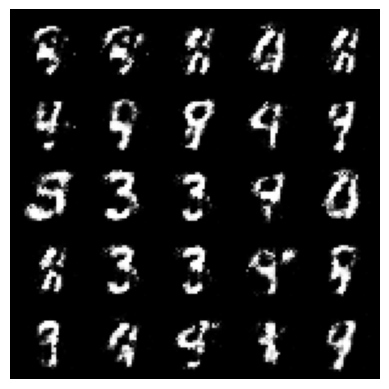

Epoch: 75/200 Steps:469	Epoch_Run_Time: 9.046919	Loss_D : 0.212129	Loss_G : 2.273959	
Epoch: 75/200 Total Steps:35644	Total_Time : 684.559991
Loss_D : 0.212129	Loss_G : 2.273959
Loss_D_Mean : 0.224994	Loss_G_Mean : 2.598226


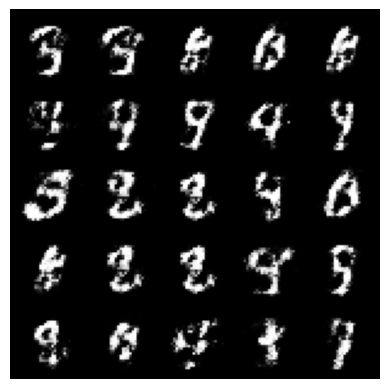

Epoch: 76/200 Steps:469	Epoch_Run_Time: 9.065084	Loss_D : 0.322102	Loss_G : 2.534281	
Epoch: 76/200 Total Steps:36113	Total_Time : 693.713709
Loss_D : 0.322102	Loss_G : 2.534281
Loss_D_Mean : 0.252920	Loss_G_Mean : 2.522792


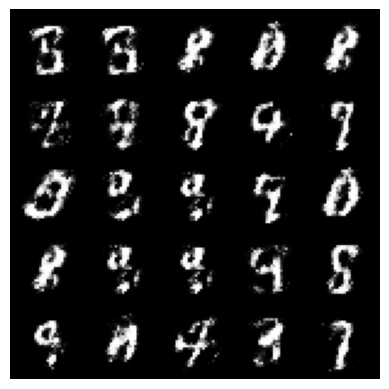

Epoch: 77/200 Steps:469	Epoch_Run_Time: 8.960651	Loss_D : 0.217082	Loss_G : 2.504244	
Epoch: 77/200 Total Steps:36582	Total_Time : 702.762376
Loss_D : 0.217082	Loss_G : 2.504244
Loss_D_Mean : 0.242558	Loss_G_Mean : 2.556172


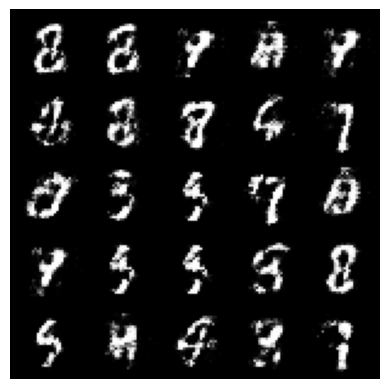

Epoch: 78/200 Steps:469	Epoch_Run_Time: 9.085573	Loss_D : 0.170857	Loss_G : 2.785614	
Epoch: 78/200 Total Steps:37051	Total_Time : 711.938827
Loss_D : 0.170857	Loss_G : 2.785614
Loss_D_Mean : 0.226924	Loss_G_Mean : 2.594333


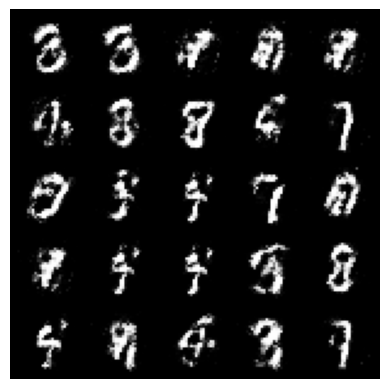

Epoch: 79/200 Steps:469	Epoch_Run_Time: 9.066285	Loss_D : 0.247650	Loss_G : 2.401844	
Epoch: 79/200 Total Steps:37520	Total_Time : 721.086038
Loss_D : 0.247650	Loss_G : 2.401844
Loss_D_Mean : 0.250395	Loss_G_Mean : 2.511831


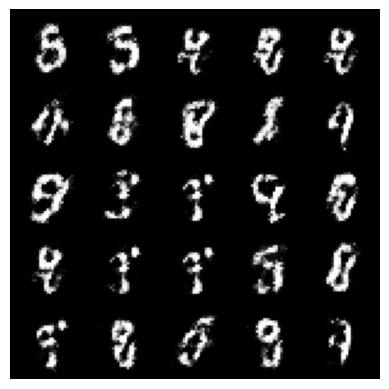

Epoch: 80/200 Steps:469	Epoch_Run_Time: 8.908633	Loss_D : 0.287956	Loss_G : 2.640616	
Epoch: 80/200 Total Steps:37989	Total_Time : 730.078601
Loss_D : 0.287956	Loss_G : 2.640616
Loss_D_Mean : 0.270371	Loss_G_Mean : 2.426270


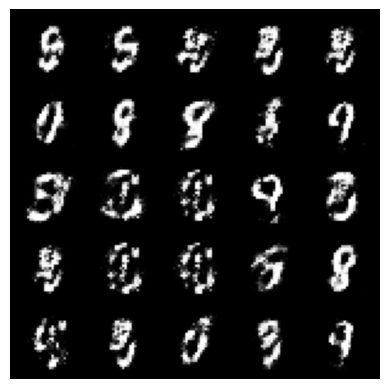

Epoch: 81/200 Steps:469	Epoch_Run_Time: 8.862529	Loss_D : 0.245170	Loss_G : 2.265003	
Epoch: 81/200 Total Steps:38458	Total_Time : 739.029374
Loss_D : 0.245170	Loss_G : 2.265003
Loss_D_Mean : 0.272183	Loss_G_Mean : 2.518568


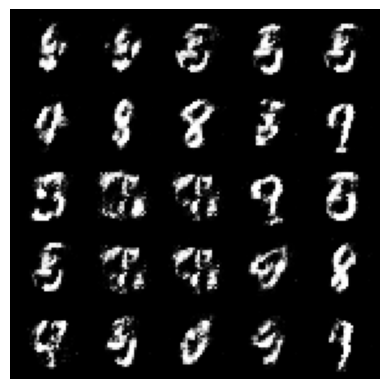

Epoch: 82/200 Steps:469	Epoch_Run_Time: 9.128305	Loss_D : 0.317892	Loss_G : 2.743665	
Epoch: 82/200 Total Steps:38927	Total_Time : 748.244727
Loss_D : 0.317892	Loss_G : 2.743665
Loss_D_Mean : 0.278191	Loss_G_Mean : 2.393439


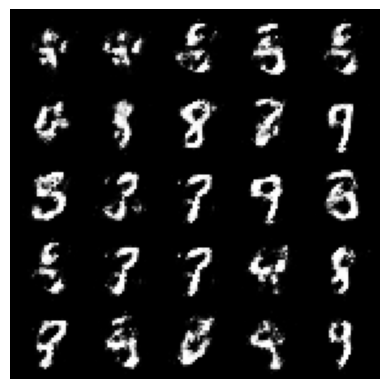

Epoch: 83/200 Steps:469	Epoch_Run_Time: 9.039329	Loss_D : 0.328728	Loss_G : 2.306303	
Epoch: 83/200 Total Steps:39396	Total_Time : 757.360244
Loss_D : 0.328728	Loss_G : 2.306303
Loss_D_Mean : 0.266251	Loss_G_Mean : 2.431311


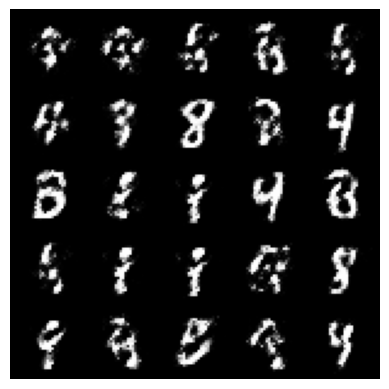

Epoch: 84/200 Steps:469	Epoch_Run_Time: 9.071893	Loss_D : 0.236189	Loss_G : 2.489317	
Epoch: 84/200 Total Steps:39865	Total_Time : 766.507724
Loss_D : 0.236189	Loss_G : 2.489317
Loss_D_Mean : 0.278652	Loss_G_Mean : 2.352267


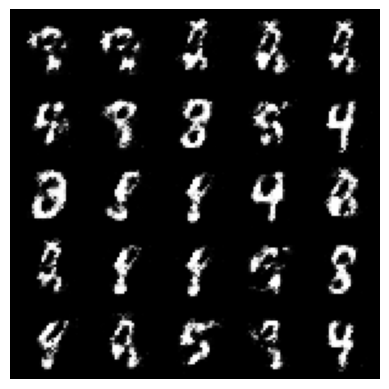

Epoch: 85/200 Steps:469	Epoch_Run_Time: 8.806187	Loss_D : 0.308059	Loss_G : 2.482867	
Epoch: 85/200 Total Steps:40334	Total_Time : 775.397776
Loss_D : 0.308059	Loss_G : 2.482867
Loss_D_Mean : 0.283723	Loss_G_Mean : 2.342159


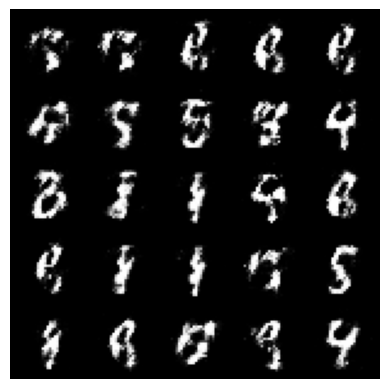

Epoch: 86/200 Steps:469	Epoch_Run_Time: 8.794207	Loss_D : 0.320534	Loss_G : 2.424979	
Epoch: 86/200 Total Steps:40803	Total_Time : 784.269916
Loss_D : 0.320534	Loss_G : 2.424979
Loss_D_Mean : 0.258365	Loss_G_Mean : 2.423981


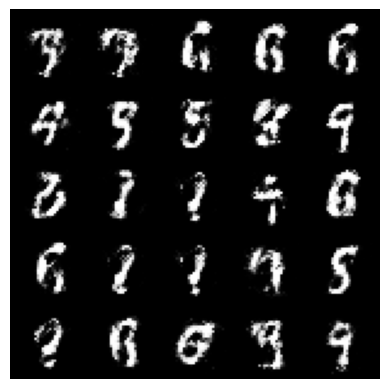

Epoch: 87/200 Steps:469	Epoch_Run_Time: 8.888027	Loss_D : 0.236947	Loss_G : 2.609995	
Epoch: 87/200 Total Steps:41272	Total_Time : 793.233636
Loss_D : 0.236947	Loss_G : 2.609995
Loss_D_Mean : 0.283582	Loss_G_Mean : 2.256649


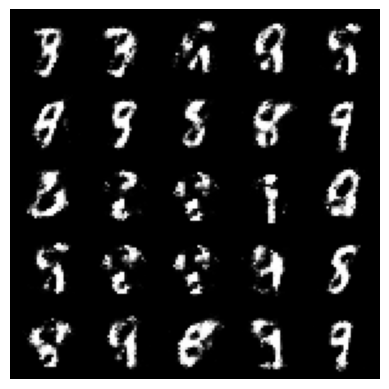

Epoch: 88/200 Steps:469	Epoch_Run_Time: 8.648520	Loss_D : 0.299841	Loss_G : 2.245090	
Epoch: 88/200 Total Steps:41741	Total_Time : 801.955235
Loss_D : 0.299841	Loss_G : 2.245090
Loss_D_Mean : 0.276565	Loss_G_Mean : 2.330893


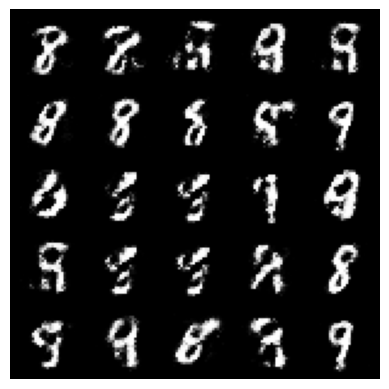

Epoch: 89/200 Steps:469	Epoch_Run_Time: 8.662353	Loss_D : 0.352237	Loss_G : 1.963814	
Epoch: 89/200 Total Steps:42210	Total_Time : 810.690119
Loss_D : 0.352237	Loss_G : 1.963814
Loss_D_Mean : 0.304466	Loss_G_Mean : 2.202170


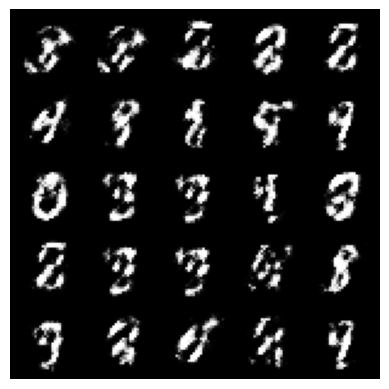

Epoch: 90/200 Steps:469	Epoch_Run_Time: 8.645654	Loss_D : 0.272555	Loss_G : 2.262372	
Epoch: 90/200 Total Steps:42679	Total_Time : 819.409147
Loss_D : 0.272555	Loss_G : 2.262372
Loss_D_Mean : 0.287613	Loss_G_Mean : 2.239713


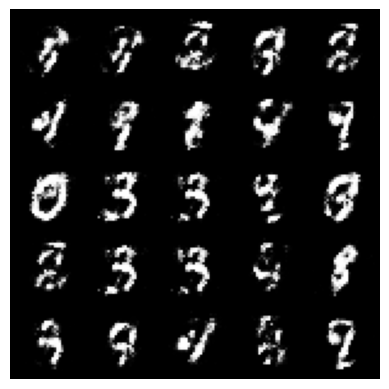

Epoch: 91/200 Steps:469	Epoch_Run_Time: 8.653389	Loss_D : 0.313126	Loss_G : 1.892751	
Epoch: 91/200 Total Steps:43148	Total_Time : 828.140237
Loss_D : 0.313126	Loss_G : 1.892751
Loss_D_Mean : 0.305407	Loss_G_Mean : 2.222757


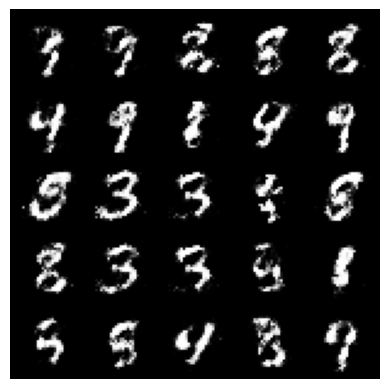

Epoch: 92/200 Steps:469	Epoch_Run_Time: 8.654983	Loss_D : 0.271381	Loss_G : 1.879939	
Epoch: 92/200 Total Steps:43617	Total_Time : 836.864766
Loss_D : 0.271381	Loss_G : 1.879939
Loss_D_Mean : 0.330839	Loss_G_Mean : 2.056794


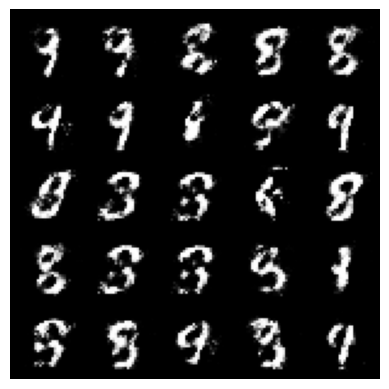

Epoch: 93/200 Steps:469	Epoch_Run_Time: 8.627236	Loss_D : 0.318450	Loss_G : 2.343607	
Epoch: 93/200 Total Steps:44086	Total_Time : 845.569202
Loss_D : 0.318450	Loss_G : 2.343607
Loss_D_Mean : 0.296096	Loss_G_Mean : 2.179551


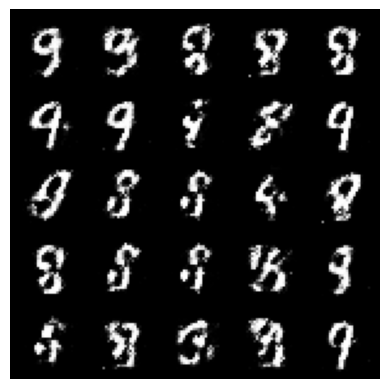

Epoch: 94/200 Steps:469	Epoch_Run_Time: 8.746491	Loss_D : 0.371961	Loss_G : 2.094329	
Epoch: 94/200 Total Steps:44555	Total_Time : 854.395469
Loss_D : 0.371961	Loss_G : 2.094329
Loss_D_Mean : 0.297895	Loss_G_Mean : 2.236169


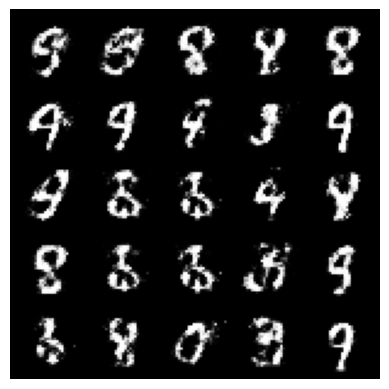

Epoch: 95/200 Steps:469	Epoch_Run_Time: 8.636111	Loss_D : 0.289931	Loss_G : 2.244028	
Epoch: 95/200 Total Steps:45024	Total_Time : 863.108280
Loss_D : 0.289931	Loss_G : 2.244028
Loss_D_Mean : 0.285759	Loss_G_Mean : 2.202745


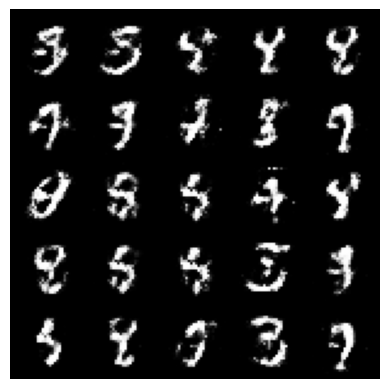

Epoch: 96/200 Steps:469	Epoch_Run_Time: 8.629554	Loss_D : 0.292813	Loss_G : 1.952798	
Epoch: 96/200 Total Steps:45493	Total_Time : 871.820531
Loss_D : 0.292813	Loss_G : 1.952798
Loss_D_Mean : 0.275603	Loss_G_Mean : 2.252232


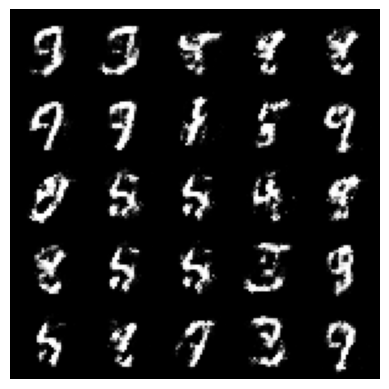

Epoch: 97/200 Steps:469	Epoch_Run_Time: 8.643601	Loss_D : 0.244846	Loss_G : 2.338416	
Epoch: 97/200 Total Steps:45962	Total_Time : 880.537824
Loss_D : 0.244846	Loss_G : 2.338416
Loss_D_Mean : 0.304950	Loss_G_Mean : 2.193684


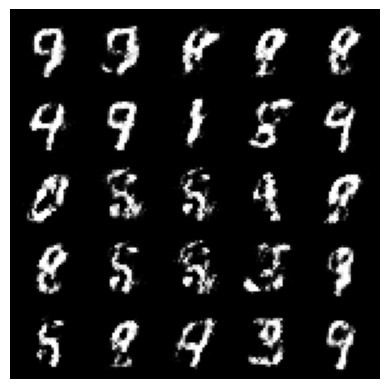

Epoch: 98/200 Steps:469	Epoch_Run_Time: 8.859478	Loss_D : 0.231887	Loss_G : 2.131177	
Epoch: 98/200 Total Steps:46431	Total_Time : 889.472021
Loss_D : 0.231887	Loss_G : 2.131177
Loss_D_Mean : 0.309960	Loss_G_Mean : 2.085618


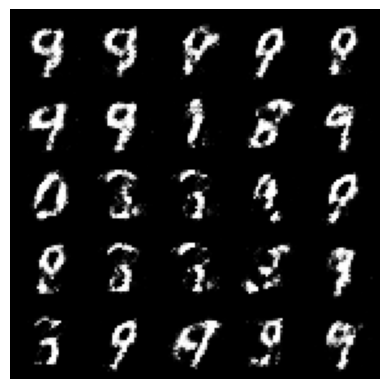

Epoch: 99/200 Steps:469	Epoch_Run_Time: 8.677026	Loss_D : 0.301788	Loss_G : 2.361776	
Epoch: 99/200 Total Steps:46900	Total_Time : 898.223738
Loss_D : 0.301788	Loss_G : 2.361776
Loss_D_Mean : 0.294283	Loss_G_Mean : 2.147585


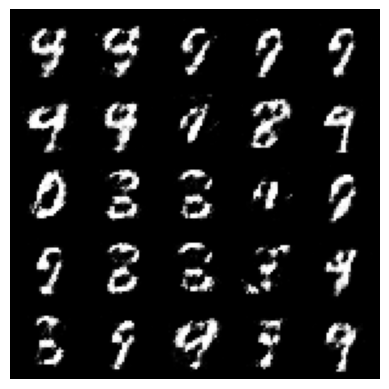

Epoch: 100/200 Steps:469	Epoch_Run_Time: 8.684200	Loss_D : 0.348791	Loss_G : 2.016072	
Epoch: 100/200 Total Steps:47369	Total_Time : 906.979941
Loss_D : 0.348791	Loss_G : 2.016072
Loss_D_Mean : 0.314832	Loss_G_Mean : 2.122409


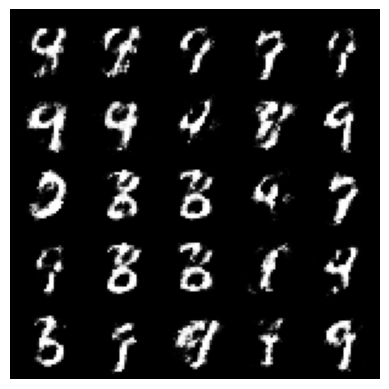

Epoch: 101/200 Steps:469	Epoch_Run_Time: 8.657228	Loss_D : 0.303672	Loss_G : 2.096937	
Epoch: 101/200 Total Steps:47838	Total_Time : 915.715042
Loss_D : 0.303672	Loss_G : 2.096937
Loss_D_Mean : 0.326804	Loss_G_Mean : 2.090971


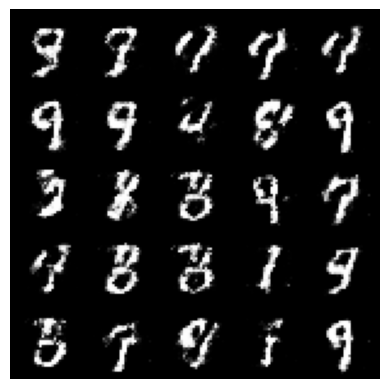

Epoch: 102/200 Steps:469	Epoch_Run_Time: 8.638831	Loss_D : 0.290044	Loss_G : 1.866845	
Epoch: 102/200 Total Steps:48307	Total_Time : 924.426048
Loss_D : 0.290044	Loss_G : 1.866845
Loss_D_Mean : 0.330609	Loss_G_Mean : 1.977271


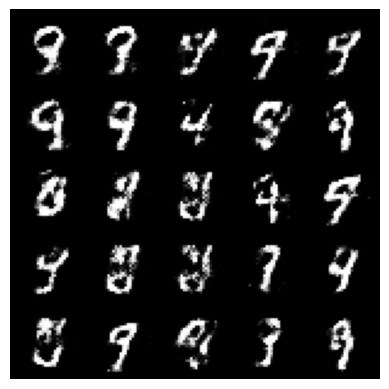

Epoch: 103/200 Steps:469	Epoch_Run_Time: 8.606251	Loss_D : 0.243329	Loss_G : 2.139064	
Epoch: 103/200 Total Steps:48776	Total_Time : 933.102502
Loss_D : 0.243329	Loss_G : 2.139064
Loss_D_Mean : 0.317879	Loss_G_Mean : 2.019173


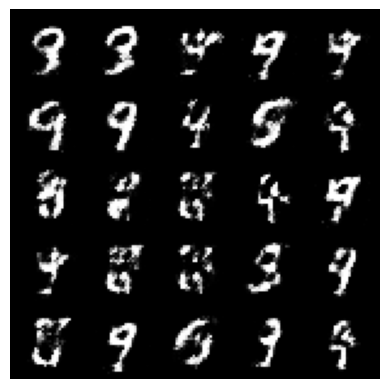

Epoch: 104/200 Steps:469	Epoch_Run_Time: 8.656681	Loss_D : 0.288974	Loss_G : 1.970746	
Epoch: 104/200 Total Steps:49245	Total_Time : 941.840354
Loss_D : 0.288974	Loss_G : 1.970746
Loss_D_Mean : 0.330578	Loss_G_Mean : 2.050277


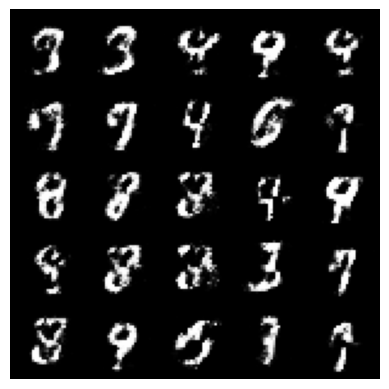

Epoch: 105/200 Steps:469	Epoch_Run_Time: 8.857725	Loss_D : 0.243584	Loss_G : 2.068587	
Epoch: 105/200 Total Steps:49714	Total_Time : 950.783210
Loss_D : 0.243584	Loss_G : 2.068587
Loss_D_Mean : 0.337967	Loss_G_Mean : 1.970730


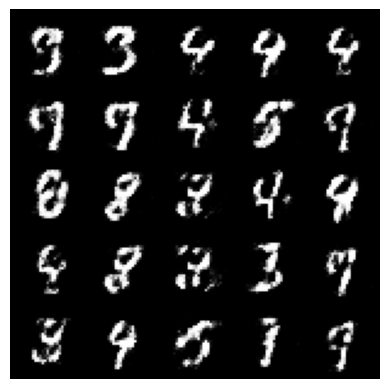

Epoch: 106/200 Steps:469	Epoch_Run_Time: 8.877988	Loss_D : 0.339974	Loss_G : 1.788263	
Epoch: 106/200 Total Steps:50183	Total_Time : 959.741014
Loss_D : 0.339974	Loss_G : 1.788263
Loss_D_Mean : 0.309346	Loss_G_Mean : 2.066542


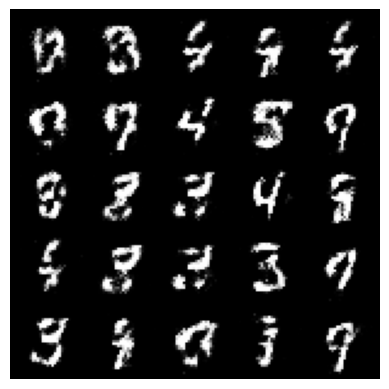

Epoch: 107/200 Steps:469	Epoch_Run_Time: 8.898228	Loss_D : 0.410532	Loss_G : 2.028917	
Epoch: 107/200 Total Steps:50652	Total_Time : 968.711428
Loss_D : 0.410532	Loss_G : 2.028917
Loss_D_Mean : 0.291240	Loss_G_Mean : 2.148028


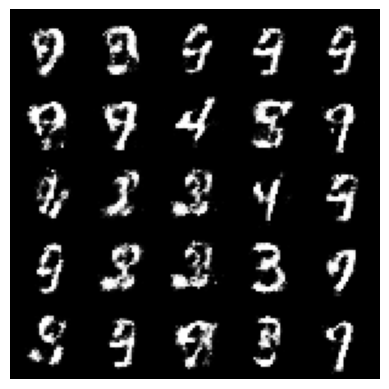

Epoch: 108/200 Steps:469	Epoch_Run_Time: 8.717275	Loss_D : 0.241516	Loss_G : 1.884377	
Epoch: 108/200 Total Steps:51121	Total_Time : 977.509968
Loss_D : 0.241516	Loss_G : 1.884377
Loss_D_Mean : 0.330557	Loss_G_Mean : 1.999832


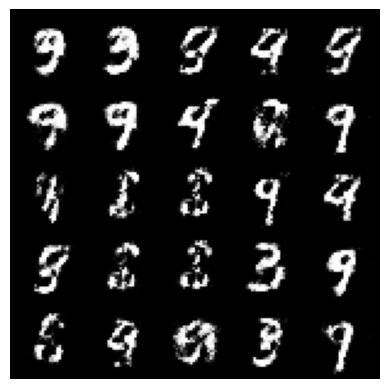

Epoch: 109/200 Steps:469	Epoch_Run_Time: 8.602489	Loss_D : 0.308314	Loss_G : 1.827092	
Epoch: 109/200 Total Steps:51590	Total_Time : 986.187565
Loss_D : 0.308314	Loss_G : 1.827092
Loss_D_Mean : 0.363240	Loss_G_Mean : 1.912393


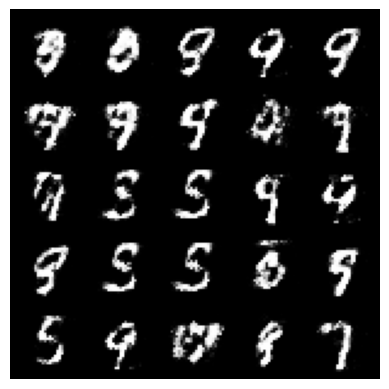

Epoch: 110/200 Steps:469	Epoch_Run_Time: 8.661673	Loss_D : 0.274529	Loss_G : 1.829806	
Epoch: 110/200 Total Steps:52059	Total_Time : 994.920539
Loss_D : 0.274529	Loss_G : 1.829806
Loss_D_Mean : 0.336015	Loss_G_Mean : 1.959481


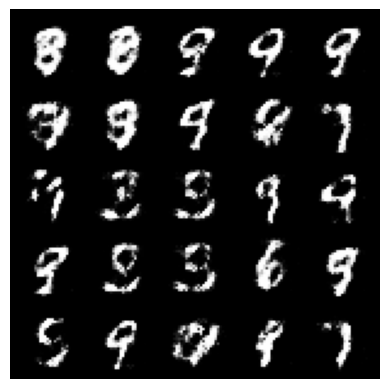

Epoch: 111/200 Steps:469	Epoch_Run_Time: 8.690854	Loss_D : 0.382624	Loss_G : 1.955182	
Epoch: 111/200 Total Steps:52528	Total_Time : 1003.686596
Loss_D : 0.382624	Loss_G : 1.955182
Loss_D_Mean : 0.364253	Loss_G_Mean : 1.875791


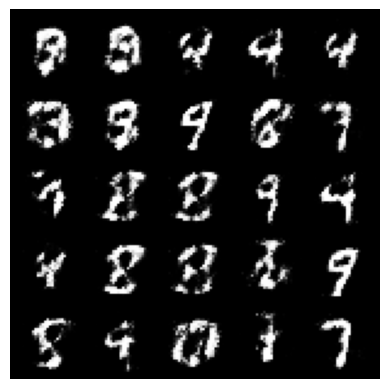

Epoch: 112/200 Steps:469	Epoch_Run_Time: 8.741559	Loss_D : 0.458031	Loss_G : 2.056899	
Epoch: 112/200 Total Steps:52997	Total_Time : 1012.509536
Loss_D : 0.458031	Loss_G : 2.056899
Loss_D_Mean : 0.366173	Loss_G_Mean : 1.879359


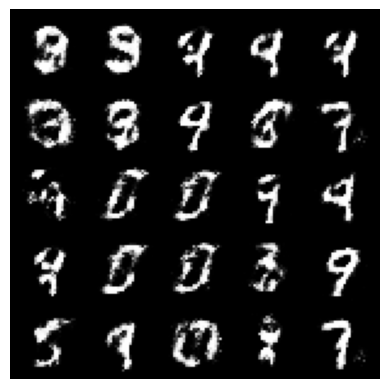

Epoch: 113/200 Steps:469	Epoch_Run_Time: 8.663504	Loss_D : 0.345795	Loss_G : 2.090162	
Epoch: 113/200 Total Steps:53466	Total_Time : 1021.249733
Loss_D : 0.345795	Loss_G : 2.090162
Loss_D_Mean : 0.388653	Loss_G_Mean : 1.810200


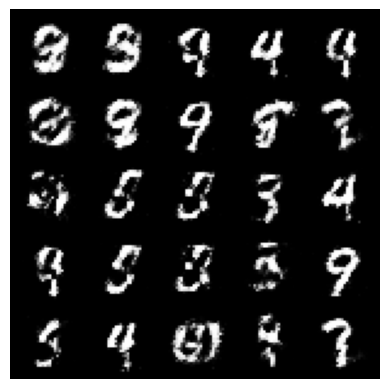

Epoch: 114/200 Steps:469	Epoch_Run_Time: 8.914180	Loss_D : 0.374305	Loss_G : 1.789963	
Epoch: 114/200 Total Steps:53935	Total_Time : 1030.239682
Loss_D : 0.374305	Loss_G : 1.789963
Loss_D_Mean : 0.376604	Loss_G_Mean : 1.788656


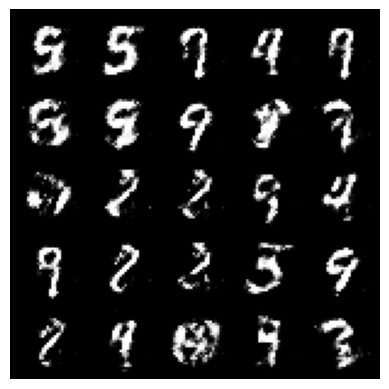

Epoch: 115/200 Steps:469	Epoch_Run_Time: 8.829957	Loss_D : 0.385032	Loss_G : 1.559123	
Epoch: 115/200 Total Steps:54404	Total_Time : 1039.147416
Loss_D : 0.385032	Loss_G : 1.559123
Loss_D_Mean : 0.362105	Loss_G_Mean : 1.827948


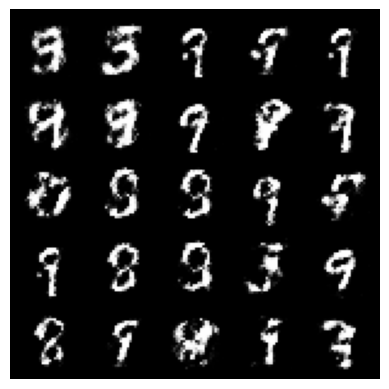

Epoch: 116/200 Steps:469	Epoch_Run_Time: 8.687991	Loss_D : 0.337294	Loss_G : 1.699510	
Epoch: 116/200 Total Steps:54873	Total_Time : 1047.923008
Loss_D : 0.337294	Loss_G : 1.699510
Loss_D_Mean : 0.353769	Loss_G_Mean : 1.809117


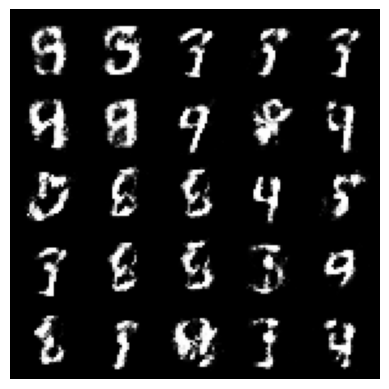

Epoch: 117/200 Steps:469	Epoch_Run_Time: 8.649618	Loss_D : 0.354681	Loss_G : 1.993000	
Epoch: 117/200 Total Steps:55342	Total_Time : 1056.645968
Loss_D : 0.354681	Loss_G : 1.993000
Loss_D_Mean : 0.365478	Loss_G_Mean : 1.810841


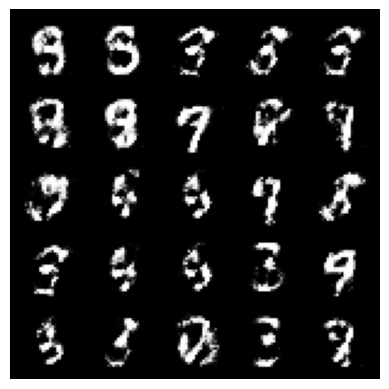

Epoch: 118/200 Steps:469	Epoch_Run_Time: 8.704617	Loss_D : 0.364274	Loss_G : 1.610686	
Epoch: 118/200 Total Steps:55811	Total_Time : 1065.420187
Loss_D : 0.364274	Loss_G : 1.610686
Loss_D_Mean : 0.361372	Loss_G_Mean : 1.858047


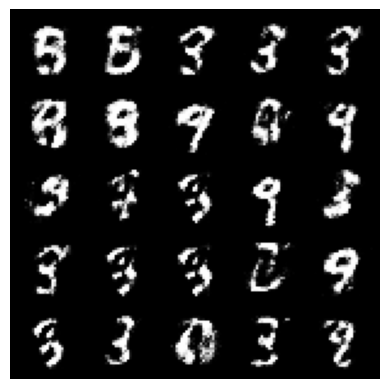

Epoch: 119/200 Steps:469	Epoch_Run_Time: 8.673862	Loss_D : 0.370047	Loss_G : 1.688910	
Epoch: 119/200 Total Steps:56280	Total_Time : 1074.179973
Loss_D : 0.370047	Loss_G : 1.688910
Loss_D_Mean : 0.390594	Loss_G_Mean : 1.710690


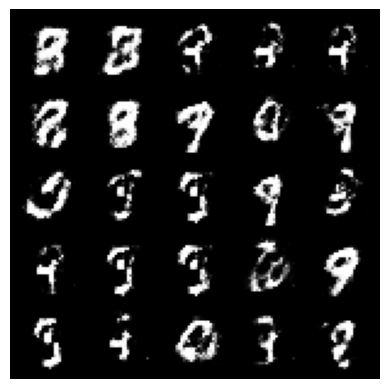

Epoch: 120/200 Steps:469	Epoch_Run_Time: 8.683103	Loss_D : 0.386192	Loss_G : 1.593111	
Epoch: 120/200 Total Steps:56749	Total_Time : 1082.946289
Loss_D : 0.386192	Loss_G : 1.593111
Loss_D_Mean : 0.383957	Loss_G_Mean : 1.695056


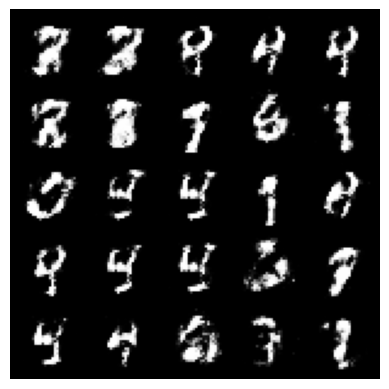

Epoch: 121/200 Steps:469	Epoch_Run_Time: 8.634002	Loss_D : 0.392050	Loss_G : 1.718383	
Epoch: 121/200 Total Steps:57218	Total_Time : 1091.663001
Loss_D : 0.392050	Loss_G : 1.718383
Loss_D_Mean : 0.367303	Loss_G_Mean : 1.750674


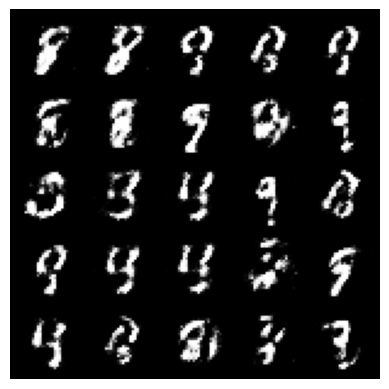

Epoch: 122/200 Steps:469	Epoch_Run_Time: 8.647454	Loss_D : 0.337915	Loss_G : 1.561476	
Epoch: 122/200 Total Steps:57687	Total_Time : 1100.381141
Loss_D : 0.337915	Loss_G : 1.561476
Loss_D_Mean : 0.364824	Loss_G_Mean : 1.808115


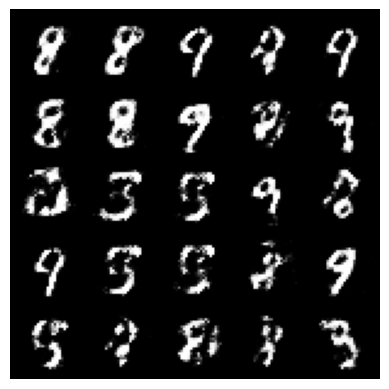

Epoch: 123/200 Steps:469	Epoch_Run_Time: 8.649753	Loss_D : 0.518136	Loss_G : 1.745332	
Epoch: 123/200 Total Steps:58156	Total_Time : 1109.104826
Loss_D : 0.518136	Loss_G : 1.745332
Loss_D_Mean : 0.374473	Loss_G_Mean : 1.790292


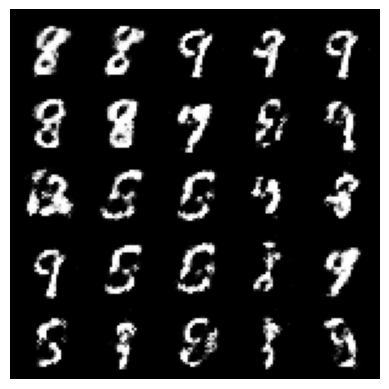

Epoch: 124/200 Steps:469	Epoch_Run_Time: 8.673530	Loss_D : 0.350193	Loss_G : 1.817964	
Epoch: 124/200 Total Steps:58625	Total_Time : 1117.848037
Loss_D : 0.350193	Loss_G : 1.817964
Loss_D_Mean : 0.368624	Loss_G_Mean : 1.739679


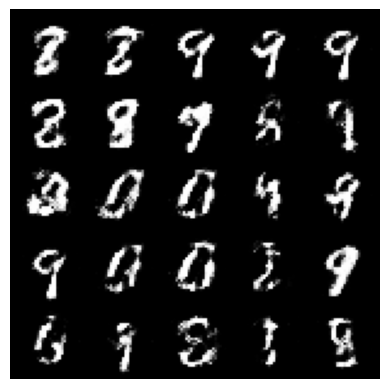

Epoch: 125/200 Steps:469	Epoch_Run_Time: 8.624207	Loss_D : 0.360090	Loss_G : 1.808784	
Epoch: 125/200 Total Steps:59094	Total_Time : 1126.548940
Loss_D : 0.360090	Loss_G : 1.808784
Loss_D_Mean : 0.388311	Loss_G_Mean : 1.695738


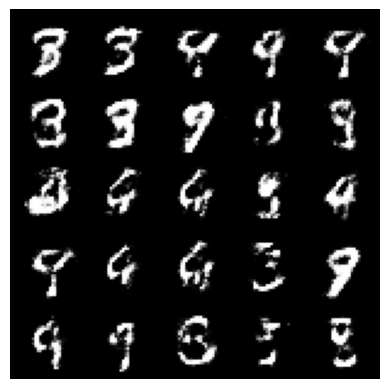

Epoch: 126/200 Steps:469	Epoch_Run_Time: 8.658884	Loss_D : 0.360846	Loss_G : 1.763884	
Epoch: 126/200 Total Steps:59563	Total_Time : 1135.276548
Loss_D : 0.360846	Loss_G : 1.763884
Loss_D_Mean : 0.371488	Loss_G_Mean : 1.739403


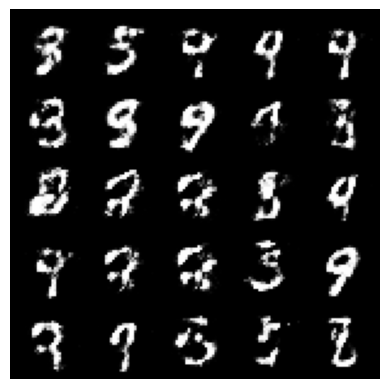

Epoch: 127/200 Steps:469	Epoch_Run_Time: 8.659618	Loss_D : 0.419994	Loss_G : 1.906695	
Epoch: 127/200 Total Steps:60032	Total_Time : 1144.011858
Loss_D : 0.419994	Loss_G : 1.906695
Loss_D_Mean : 0.384134	Loss_G_Mean : 1.731907


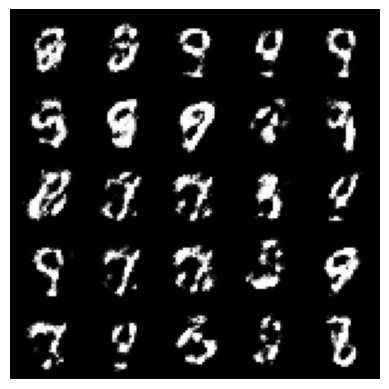

Epoch: 128/200 Steps:469	Epoch_Run_Time: 8.637657	Loss_D : 0.301951	Loss_G : 1.732393	
Epoch: 128/200 Total Steps:60501	Total_Time : 1152.721299
Loss_D : 0.301951	Loss_G : 1.732393
Loss_D_Mean : 0.424213	Loss_G_Mean : 1.592869


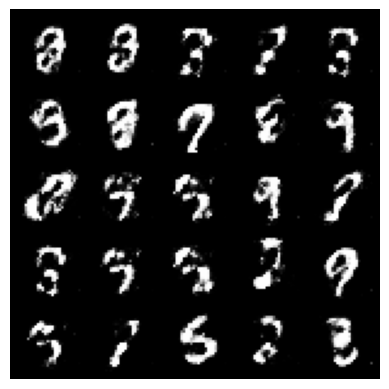

Epoch: 129/200 Steps:469	Epoch_Run_Time: 8.628769	Loss_D : 0.421147	Loss_G : 1.605296	
Epoch: 129/200 Total Steps:60970	Total_Time : 1161.434783
Loss_D : 0.421147	Loss_G : 1.605296
Loss_D_Mean : 0.369118	Loss_G_Mean : 1.775651


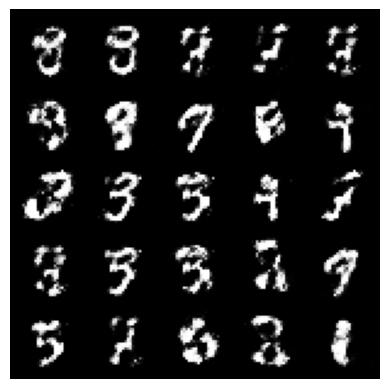

Epoch: 130/200 Steps:469	Epoch_Run_Time: 8.662883	Loss_D : 0.369700	Loss_G : 1.659250	
Epoch: 130/200 Total Steps:61439	Total_Time : 1170.179389
Loss_D : 0.369700	Loss_G : 1.659250
Loss_D_Mean : 0.403875	Loss_G_Mean : 1.695135


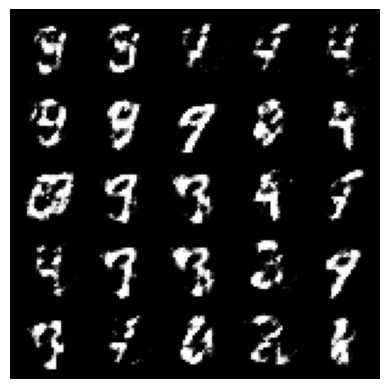

Epoch: 131/200 Steps:469	Epoch_Run_Time: 8.656830	Loss_D : 0.394209	Loss_G : 1.876194	
Epoch: 131/200 Total Steps:61908	Total_Time : 1178.911907
Loss_D : 0.394209	Loss_G : 1.876194
Loss_D_Mean : 0.402288	Loss_G_Mean : 1.642275


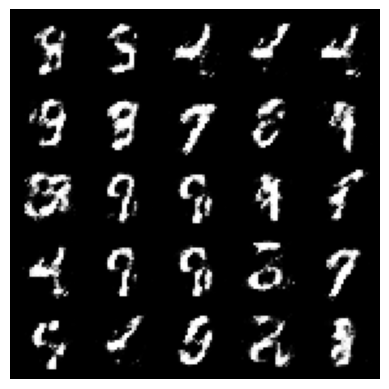

Epoch: 132/200 Steps:469	Epoch_Run_Time: 8.624098	Loss_D : 0.442865	Loss_G : 1.374007	
Epoch: 132/200 Total Steps:62377	Total_Time : 1187.626438
Loss_D : 0.442865	Loss_G : 1.374007
Loss_D_Mean : 0.371583	Loss_G_Mean : 1.723840


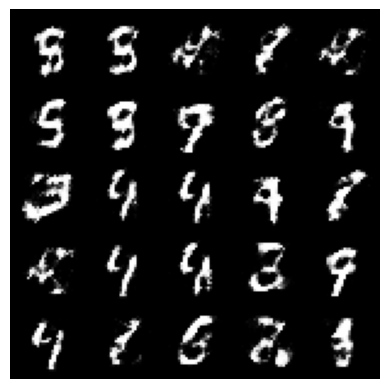

Epoch: 133/200 Steps:469	Epoch_Run_Time: 8.648705	Loss_D : 0.376281	Loss_G : 1.757856	
Epoch: 133/200 Total Steps:62846	Total_Time : 1196.353909
Loss_D : 0.376281	Loss_G : 1.757856
Loss_D_Mean : 0.380856	Loss_G_Mean : 1.683155


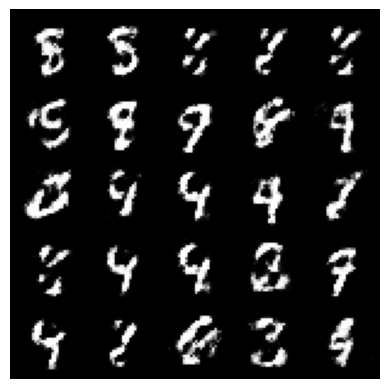

Epoch: 134/200 Steps:469	Epoch_Run_Time: 8.631756	Loss_D : 0.494665	Loss_G : 1.593663	
Epoch: 134/200 Total Steps:63315	Total_Time : 1205.059357
Loss_D : 0.494665	Loss_G : 1.593663
Loss_D_Mean : 0.410076	Loss_G_Mean : 1.618252


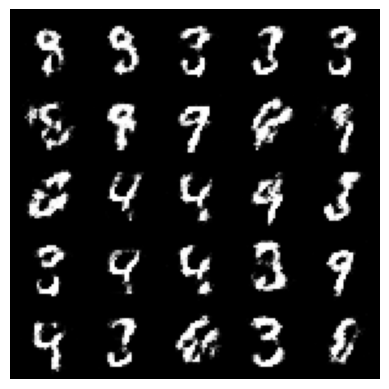

Epoch: 135/200 Steps:469	Epoch_Run_Time: 8.672886	Loss_D : 0.361325	Loss_G : 1.621022	
Epoch: 135/200 Total Steps:63784	Total_Time : 1213.805959
Loss_D : 0.361325	Loss_G : 1.621022
Loss_D_Mean : 0.391659	Loss_G_Mean : 1.655242


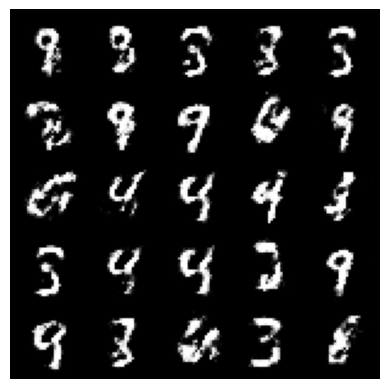

Epoch: 136/200 Steps:469	Epoch_Run_Time: 8.668679	Loss_D : 0.360669	Loss_G : 1.690615	
Epoch: 136/200 Total Steps:64253	Total_Time : 1222.545914
Loss_D : 0.360669	Loss_G : 1.690615
Loss_D_Mean : 0.389095	Loss_G_Mean : 1.712582


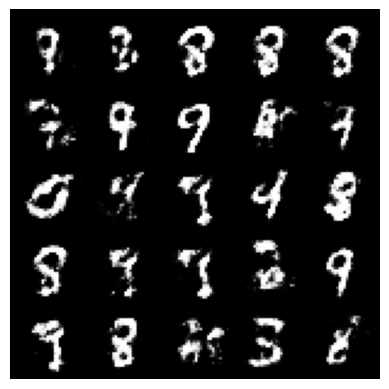

Epoch: 137/200 Steps:469	Epoch_Run_Time: 8.635069	Loss_D : 0.313159	Loss_G : 1.915538	
Epoch: 137/200 Total Steps:64722	Total_Time : 1231.414654
Loss_D : 0.313159	Loss_G : 1.915538
Loss_D_Mean : 0.367099	Loss_G_Mean : 1.716962


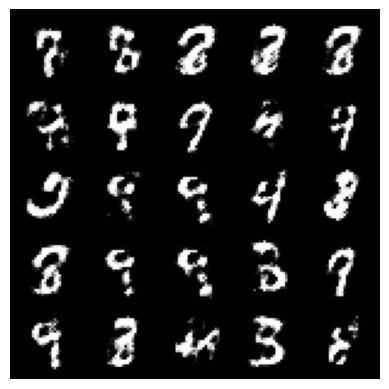

Epoch: 138/200 Steps:469	Epoch_Run_Time: 8.650512	Loss_D : 0.398621	Loss_G : 1.485343	
Epoch: 138/200 Total Steps:65191	Total_Time : 1240.135012
Loss_D : 0.398621	Loss_G : 1.485343
Loss_D_Mean : 0.401113	Loss_G_Mean : 1.682478


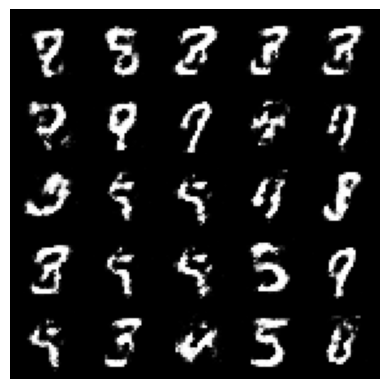

Epoch: 139/200 Steps:469	Epoch_Run_Time: 8.631495	Loss_D : 0.438537	Loss_G : 1.478426	
Epoch: 139/200 Total Steps:65660	Total_Time : 1248.837458
Loss_D : 0.438537	Loss_G : 1.478426
Loss_D_Mean : 0.363409	Loss_G_Mean : 1.751286


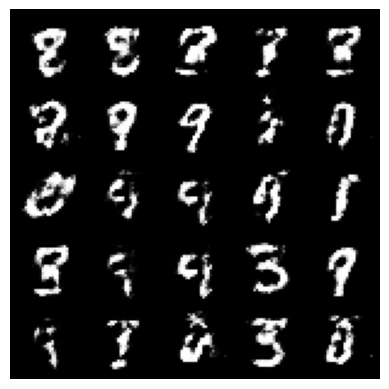

Epoch: 140/200 Steps:469	Epoch_Run_Time: 8.628756	Loss_D : 0.306404	Loss_G : 1.393997	
Epoch: 140/200 Total Steps:66129	Total_Time : 1257.537896
Loss_D : 0.306404	Loss_G : 1.393997
Loss_D_Mean : 0.373582	Loss_G_Mean : 1.686158


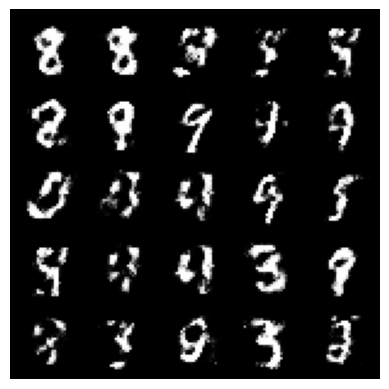

Epoch: 141/200 Steps:469	Epoch_Run_Time: 8.655465	Loss_D : 0.444714	Loss_G : 1.390644	
Epoch: 141/200 Total Steps:66598	Total_Time : 1266.272059
Loss_D : 0.444714	Loss_G : 1.390644
Loss_D_Mean : 0.401491	Loss_G_Mean : 1.638430


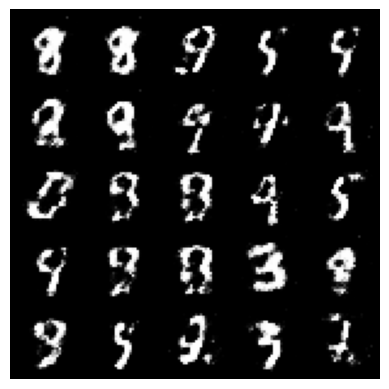

Epoch: 142/200 Steps:469	Epoch_Run_Time: 8.666942	Loss_D : 0.480015	Loss_G : 1.637965	
Epoch: 142/200 Total Steps:67067	Total_Time : 1275.011686
Loss_D : 0.480015	Loss_G : 1.637965
Loss_D_Mean : 0.392192	Loss_G_Mean : 1.689952


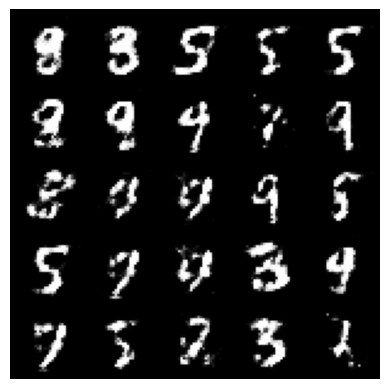

Epoch: 143/200 Steps:469	Epoch_Run_Time: 8.619885	Loss_D : 0.353989	Loss_G : 1.509151	
Epoch: 143/200 Total Steps:67536	Total_Time : 1283.709596
Loss_D : 0.353989	Loss_G : 1.509151
Loss_D_Mean : 0.402217	Loss_G_Mean : 1.600485


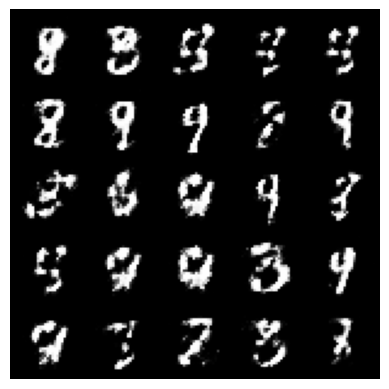

Epoch: 144/200 Steps:469	Epoch_Run_Time: 8.668963	Loss_D : 0.423253	Loss_G : 1.606657	
Epoch: 144/200 Total Steps:68005	Total_Time : 1292.458288
Loss_D : 0.423253	Loss_G : 1.606657
Loss_D_Mean : 0.380300	Loss_G_Mean : 1.664832


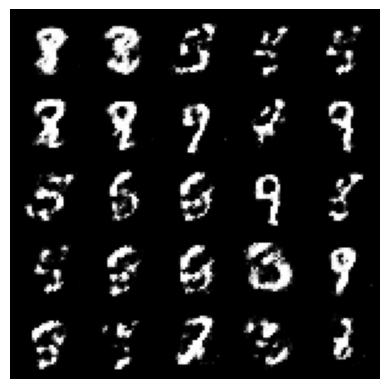

Epoch: 145/200 Steps:469	Epoch_Run_Time: 8.635813	Loss_D : 0.338610	Loss_G : 1.613256	
Epoch: 145/200 Total Steps:68474	Total_Time : 1301.166980
Loss_D : 0.338610	Loss_G : 1.613256
Loss_D_Mean : 0.411543	Loss_G_Mean : 1.589493


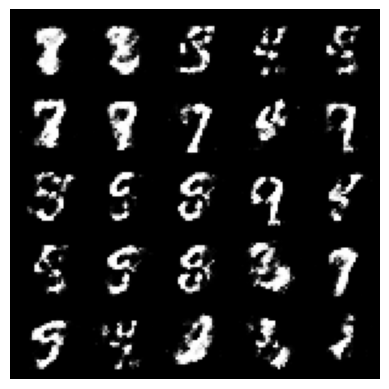

Epoch: 146/200 Steps:469	Epoch_Run_Time: 8.662511	Loss_D : 0.426432	Loss_G : 1.597853	
Epoch: 146/200 Total Steps:68943	Total_Time : 1309.907181
Loss_D : 0.426432	Loss_G : 1.597853
Loss_D_Mean : 0.418635	Loss_G_Mean : 1.526384


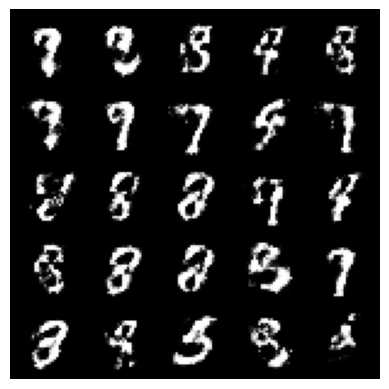

Epoch: 147/200 Steps:469	Epoch_Run_Time: 8.635404	Loss_D : 0.420841	Loss_G : 1.541515	
Epoch: 147/200 Total Steps:69412	Total_Time : 1318.621683
Loss_D : 0.420841	Loss_G : 1.541515
Loss_D_Mean : 0.381185	Loss_G_Mean : 1.679190


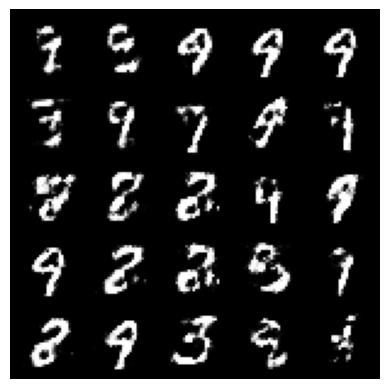

Epoch: 148/200 Steps:469	Epoch_Run_Time: 8.623751	Loss_D : 0.447116	Loss_G : 1.654778	
Epoch: 148/200 Total Steps:69881	Total_Time : 1327.319341
Loss_D : 0.447116	Loss_G : 1.654778
Loss_D_Mean : 0.398979	Loss_G_Mean : 1.649330


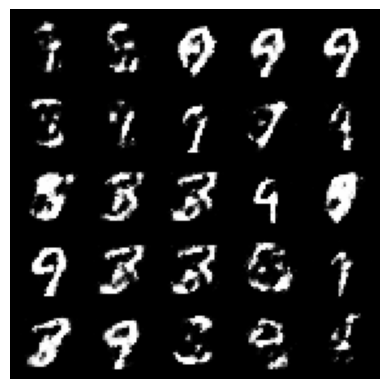

Epoch: 149/200 Steps:469	Epoch_Run_Time: 8.627107	Loss_D : 0.366431	Loss_G : 1.535833	
Epoch: 149/200 Total Steps:70350	Total_Time : 1336.026151
Loss_D : 0.366431	Loss_G : 1.535833
Loss_D_Mean : 0.423825	Loss_G_Mean : 1.561975


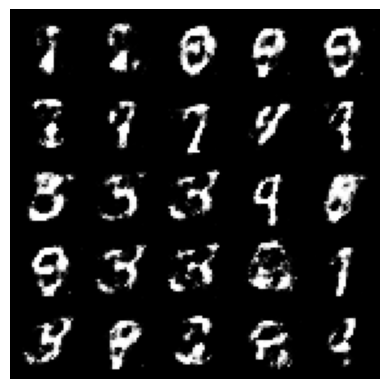

Epoch: 150/200 Steps:469	Epoch_Run_Time: 8.643481	Loss_D : 0.387953	Loss_G : 1.549913	
Epoch: 150/200 Total Steps:70819	Total_Time : 1344.743321
Loss_D : 0.387953	Loss_G : 1.549913
Loss_D_Mean : 0.398343	Loss_G_Mean : 1.581632


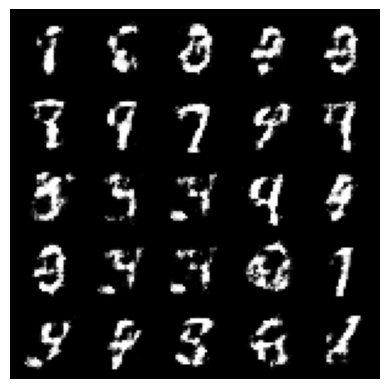

Epoch: 151/200 Steps:469	Epoch_Run_Time: 8.640356	Loss_D : 0.432719	Loss_G : 1.405409	
Epoch: 151/200 Total Steps:71288	Total_Time : 1353.457310
Loss_D : 0.432719	Loss_G : 1.405409
Loss_D_Mean : 0.415194	Loss_G_Mean : 1.563035


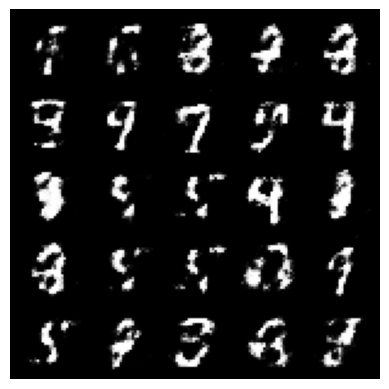

Epoch: 152/200 Steps:469	Epoch_Run_Time: 8.636018	Loss_D : 0.444366	Loss_G : 1.545102	
Epoch: 152/200 Total Steps:71757	Total_Time : 1362.165009
Loss_D : 0.444366	Loss_G : 1.545102
Loss_D_Mean : 0.429970	Loss_G_Mean : 1.513352


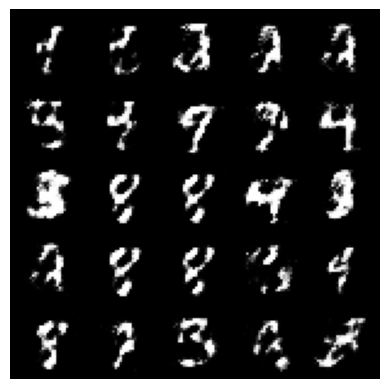

Epoch: 153/200 Steps:469	Epoch_Run_Time: 8.650750	Loss_D : 0.442240	Loss_G : 1.592396	
Epoch: 153/200 Total Steps:72226	Total_Time : 1370.892958
Loss_D : 0.442240	Loss_G : 1.592396
Loss_D_Mean : 0.412141	Loss_G_Mean : 1.577380


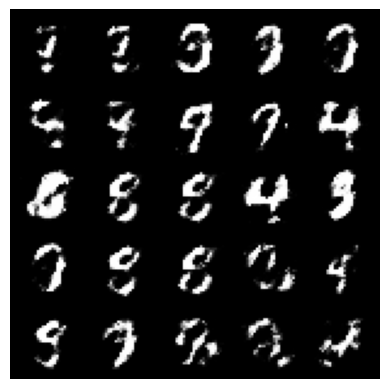

Epoch: 154/200 Steps:469	Epoch_Run_Time: 8.651183	Loss_D : 0.408552	Loss_G : 1.778427	
Epoch: 154/200 Total Steps:72695	Total_Time : 1379.616649
Loss_D : 0.408552	Loss_G : 1.778427
Loss_D_Mean : 0.438115	Loss_G_Mean : 1.516987


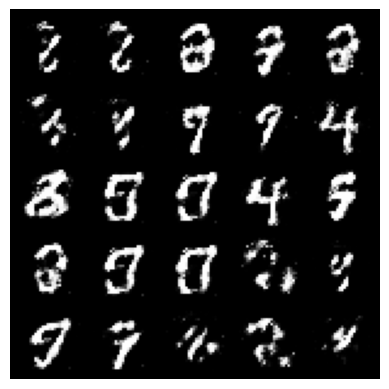

Epoch: 155/200 Steps:469	Epoch_Run_Time: 8.647579	Loss_D : 0.332512	Loss_G : 1.882118	
Epoch: 155/200 Total Steps:73164	Total_Time : 1388.336488
Loss_D : 0.332512	Loss_G : 1.882118
Loss_D_Mean : 0.354445	Loss_G_Mean : 1.734438


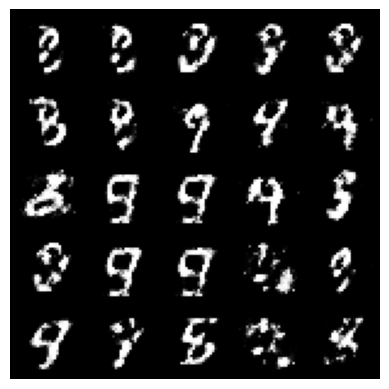

Epoch: 156/200 Steps:469	Epoch_Run_Time: 8.672976	Loss_D : 0.400874	Loss_G : 1.630874	
Epoch: 156/200 Total Steps:73633	Total_Time : 1397.082652
Loss_D : 0.400874	Loss_G : 1.630874
Loss_D_Mean : 0.383592	Loss_G_Mean : 1.708315


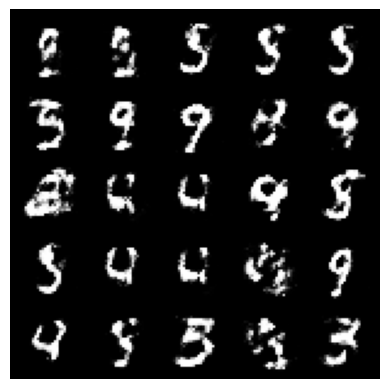

Epoch: 157/200 Steps:469	Epoch_Run_Time: 8.608091	Loss_D : 0.335882	Loss_G : 1.698560	
Epoch: 157/200 Total Steps:74102	Total_Time : 1405.769818
Loss_D : 0.335882	Loss_G : 1.698560
Loss_D_Mean : 0.396699	Loss_G_Mean : 1.600590


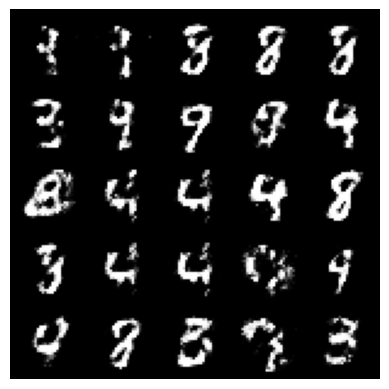

Epoch: 158/200 Steps:469	Epoch_Run_Time: 8.654331	Loss_D : 0.375113	Loss_G : 1.553494	
Epoch: 158/200 Total Steps:74571	Total_Time : 1414.493328
Loss_D : 0.375113	Loss_G : 1.553494
Loss_D_Mean : 0.408722	Loss_G_Mean : 1.590941


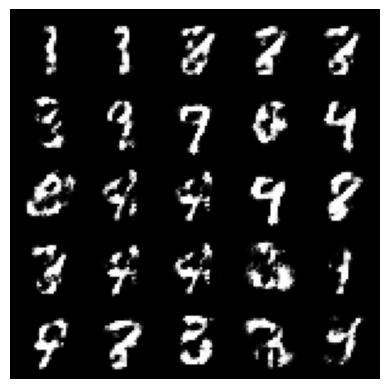

Epoch: 159/200 Steps:469	Epoch_Run_Time: 8.684529	Loss_D : 0.425994	Loss_G : 1.556124	
Epoch: 159/200 Total Steps:75040	Total_Time : 1423.254550
Loss_D : 0.425994	Loss_G : 1.556124
Loss_D_Mean : 0.407535	Loss_G_Mean : 1.587265


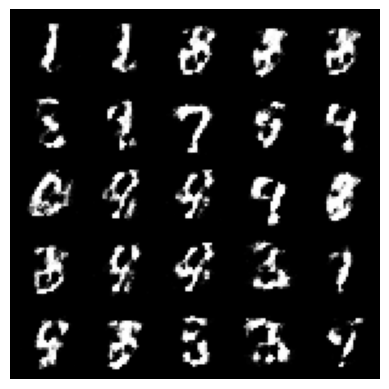

Epoch: 160/200 Steps:469	Epoch_Run_Time: 8.621848	Loss_D : 0.377451	Loss_G : 1.758674	
Epoch: 160/200 Total Steps:75509	Total_Time : 1431.958110
Loss_D : 0.377451	Loss_G : 1.758674
Loss_D_Mean : 0.384972	Loss_G_Mean : 1.623341


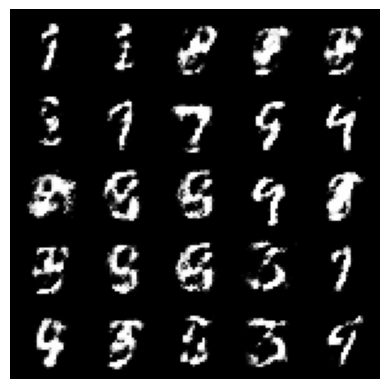

Epoch: 161/200 Steps:469	Epoch_Run_Time: 8.646435	Loss_D : 0.419784	Loss_G : 1.504099	
Epoch: 161/200 Total Steps:75978	Total_Time : 1440.678292
Loss_D : 0.419784	Loss_G : 1.504099
Loss_D_Mean : 0.387486	Loss_G_Mean : 1.650767


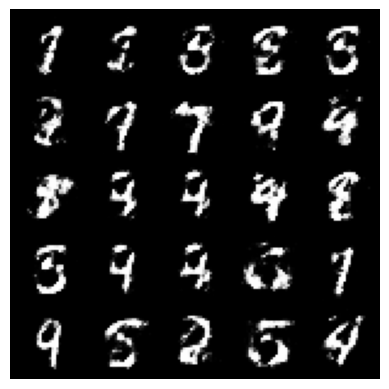

Epoch: 162/200 Steps:469	Epoch_Run_Time: 8.723928	Loss_D : 0.375226	Loss_G : 1.706218	
Epoch: 162/200 Total Steps:76447	Total_Time : 1449.470214
Loss_D : 0.375226	Loss_G : 1.706218
Loss_D_Mean : 0.420395	Loss_G_Mean : 1.577231


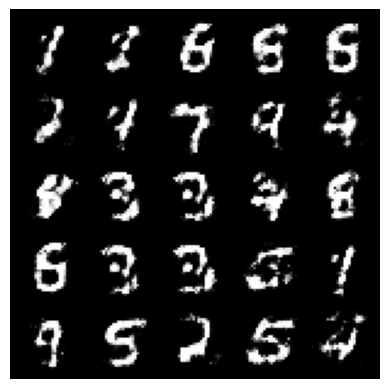

Epoch: 163/200 Steps:469	Epoch_Run_Time: 8.743162	Loss_D : 0.416614	Loss_G : 1.512370	
Epoch: 163/200 Total Steps:76916	Total_Time : 1458.292618
Loss_D : 0.416614	Loss_G : 1.512370
Loss_D_Mean : 0.416283	Loss_G_Mean : 1.575806


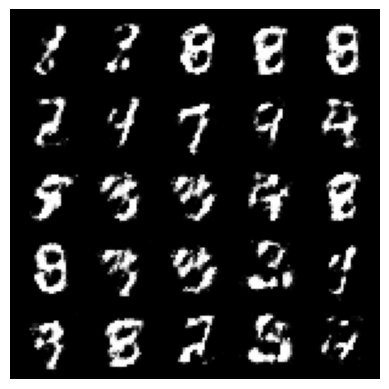

Epoch: 164/200 Steps:469	Epoch_Run_Time: 8.703653	Loss_D : 0.342956	Loss_G : 1.517203	
Epoch: 164/200 Total Steps:77385	Total_Time : 1467.068464
Loss_D : 0.342956	Loss_G : 1.517203
Loss_D_Mean : 0.422683	Loss_G_Mean : 1.523349


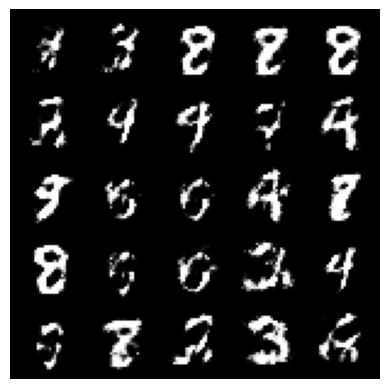

Epoch: 165/200 Steps:469	Epoch_Run_Time: 8.626707	Loss_D : 0.450003	Loss_G : 1.460149	
Epoch: 165/200 Total Steps:77854	Total_Time : 1475.772869
Loss_D : 0.450003	Loss_G : 1.460149
Loss_D_Mean : 0.402439	Loss_G_Mean : 1.585028


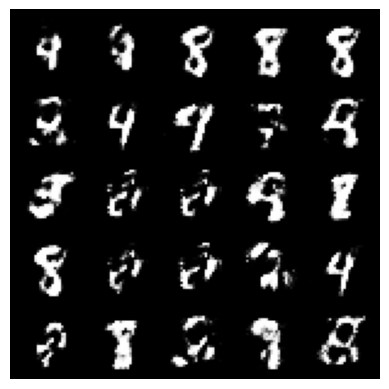

Epoch: 166/200 Steps:469	Epoch_Run_Time: 8.670525	Loss_D : 0.500932	Loss_G : 1.565662	
Epoch: 166/200 Total Steps:78323	Total_Time : 1484.520119
Loss_D : 0.500932	Loss_G : 1.565662
Loss_D_Mean : 0.396918	Loss_G_Mean : 1.600008


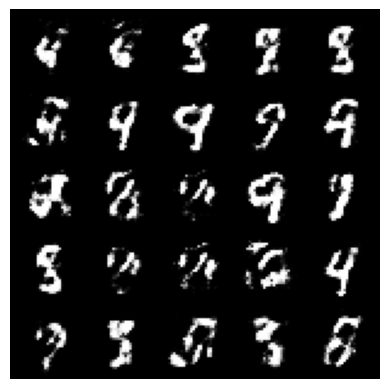

Epoch: 167/200 Steps:469	Epoch_Run_Time: 8.657903	Loss_D : 0.316421	Loss_G : 1.394564	
Epoch: 167/200 Total Steps:78792	Total_Time : 1493.250733
Loss_D : 0.316421	Loss_G : 1.394564
Loss_D_Mean : 0.425593	Loss_G_Mean : 1.516120


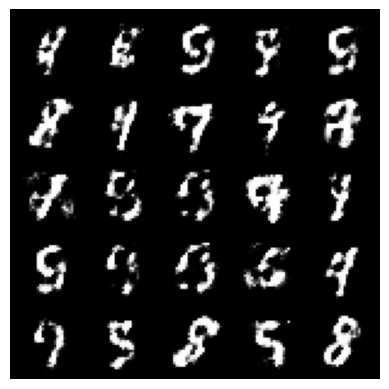

Epoch: 168/200 Steps:469	Epoch_Run_Time: 8.686289	Loss_D : 0.372626	Loss_G : 1.349317	
Epoch: 168/200 Total Steps:79261	Total_Time : 1502.021238
Loss_D : 0.372626	Loss_G : 1.349317
Loss_D_Mean : 0.425643	Loss_G_Mean : 1.492334


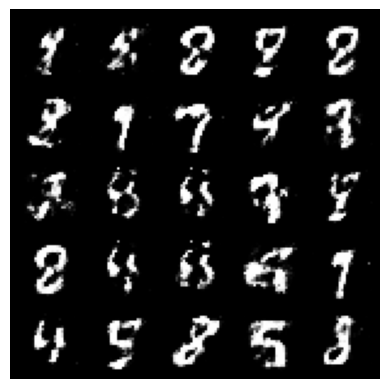

Epoch: 169/200 Steps:469	Epoch_Run_Time: 8.616624	Loss_D : 0.393301	Loss_G : 1.615354	
Epoch: 169/200 Total Steps:79730	Total_Time : 1510.716575
Loss_D : 0.393301	Loss_G : 1.615354
Loss_D_Mean : 0.411863	Loss_G_Mean : 1.533820


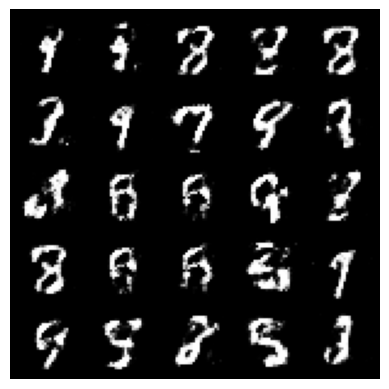

Epoch: 170/200 Steps:469	Epoch_Run_Time: 8.618159	Loss_D : 0.373286	Loss_G : 1.517412	
Epoch: 170/200 Total Steps:80199	Total_Time : 1519.412430
Loss_D : 0.373286	Loss_G : 1.517412
Loss_D_Mean : 0.424223	Loss_G_Mean : 1.527160


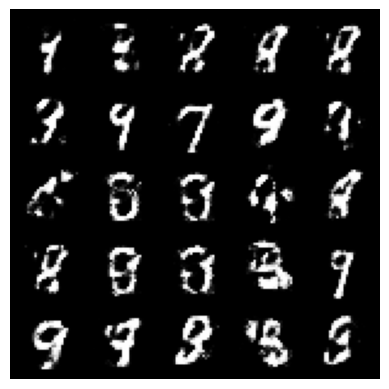

Epoch: 171/200 Steps:469	Epoch_Run_Time: 8.646092	Loss_D : 0.419098	Loss_G : 1.504627	
Epoch: 171/200 Total Steps:80668	Total_Time : 1528.127702
Loss_D : 0.419098	Loss_G : 1.504627
Loss_D_Mean : 0.443819	Loss_G_Mean : 1.478219


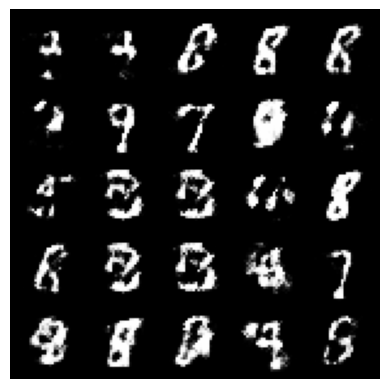

Epoch: 172/200 Steps:469	Epoch_Run_Time: 8.682950	Loss_D : 0.404008	Loss_G : 1.502089	
Epoch: 172/200 Total Steps:81137	Total_Time : 1536.881871
Loss_D : 0.404008	Loss_G : 1.502089
Loss_D_Mean : 0.414805	Loss_G_Mean : 1.512212


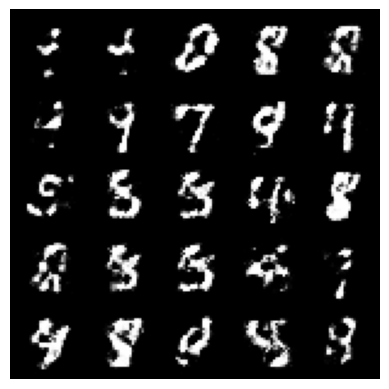

Epoch: 173/200 Steps:469	Epoch_Run_Time: 8.677349	Loss_D : 0.385970	Loss_G : 1.836354	
Epoch: 173/200 Total Steps:81606	Total_Time : 1545.632901
Loss_D : 0.385970	Loss_G : 1.836354
Loss_D_Mean : 0.400635	Loss_G_Mean : 1.569968


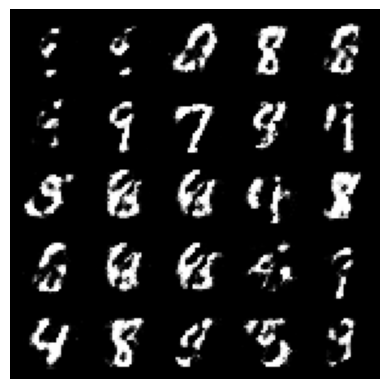

Epoch: 174/200 Steps:469	Epoch_Run_Time: 8.661237	Loss_D : 0.405105	Loss_G : 1.505763	
Epoch: 174/200 Total Steps:82075	Total_Time : 1554.369503
Loss_D : 0.405105	Loss_G : 1.505763
Loss_D_Mean : 0.423051	Loss_G_Mean : 1.536995


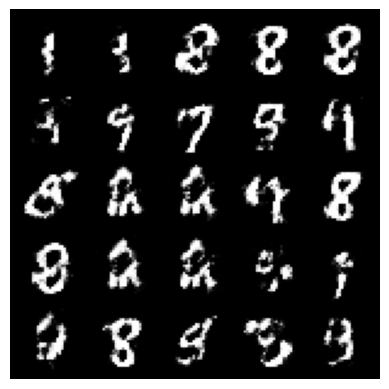

Epoch: 175/200 Steps:469	Epoch_Run_Time: 8.670176	Loss_D : 0.386643	Loss_G : 1.444443	
Epoch: 175/200 Total Steps:82544	Total_Time : 1563.117883
Loss_D : 0.386643	Loss_G : 1.444443
Loss_D_Mean : 0.421918	Loss_G_Mean : 1.519105


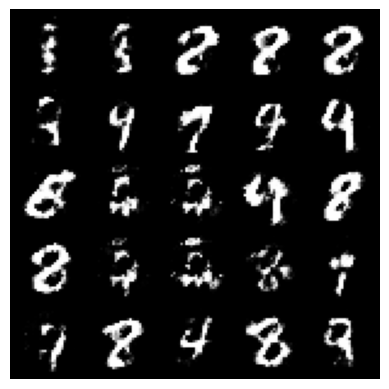

Epoch: 176/200 Steps:469	Epoch_Run_Time: 8.665789	Loss_D : 0.411015	Loss_G : 1.515310	
Epoch: 176/200 Total Steps:83013	Total_Time : 1571.861724
Loss_D : 0.411015	Loss_G : 1.515310
Loss_D_Mean : 0.433332	Loss_G_Mean : 1.457239


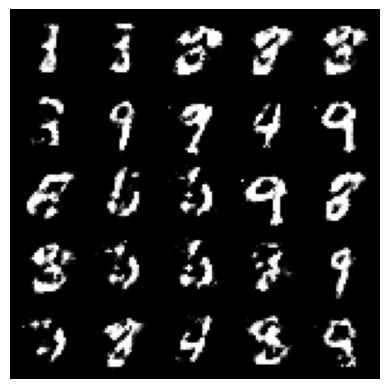

Epoch: 177/200 Steps:469	Epoch_Run_Time: 8.715461	Loss_D : 0.438193	Loss_G : 1.631047	
Epoch: 177/200 Total Steps:83482	Total_Time : 1580.651873
Loss_D : 0.438193	Loss_G : 1.631047
Loss_D_Mean : 0.440736	Loss_G_Mean : 1.460020


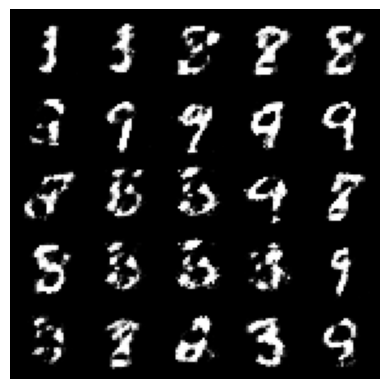

Epoch: 178/200 Steps:469	Epoch_Run_Time: 8.700006	Loss_D : 0.463187	Loss_G : 1.422795	
Epoch: 178/200 Total Steps:83951	Total_Time : 1589.426805
Loss_D : 0.463187	Loss_G : 1.422795
Loss_D_Mean : 0.451412	Loss_G_Mean : 1.435905


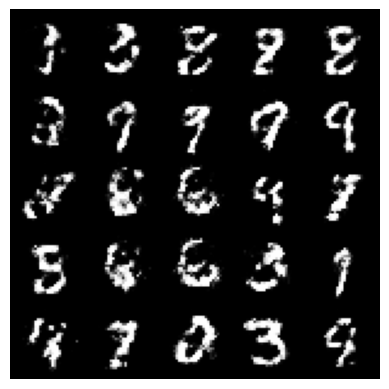

Epoch: 179/200 Steps:469	Epoch_Run_Time: 8.661661	Loss_D : 0.484186	Loss_G : 1.422744	
Epoch: 179/200 Total Steps:84420	Total_Time : 1598.165854
Loss_D : 0.484186	Loss_G : 1.422744
Loss_D_Mean : 0.454939	Loss_G_Mean : 1.418345


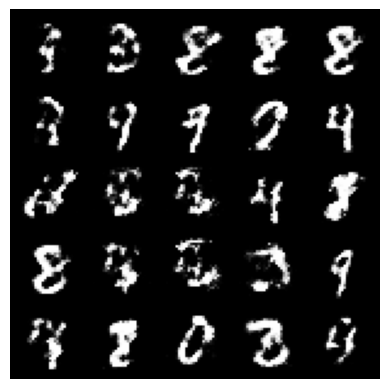

Epoch: 180/200 Steps:469	Epoch_Run_Time: 8.694160	Loss_D : 0.414875	Loss_G : 1.347751	
Epoch: 180/200 Total Steps:84889	Total_Time : 1606.936882
Loss_D : 0.414875	Loss_G : 1.347751
Loss_D_Mean : 0.433864	Loss_G_Mean : 1.506830


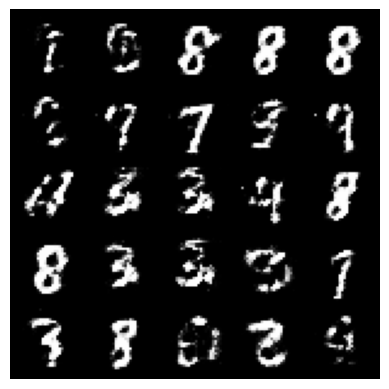

Epoch: 181/200 Steps:469	Epoch_Run_Time: 8.669538	Loss_D : 0.526963	Loss_G : 1.347147	
Epoch: 181/200 Total Steps:85358	Total_Time : 1615.684117
Loss_D : 0.526963	Loss_G : 1.347147
Loss_D_Mean : 0.479307	Loss_G_Mean : 1.352742


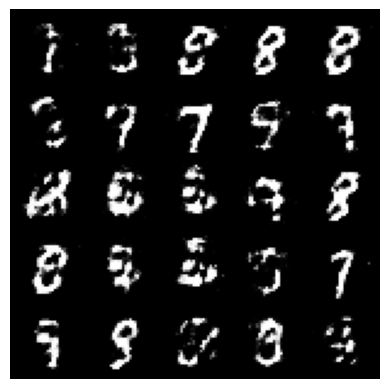

Epoch: 182/200 Steps:469	Epoch_Run_Time: 8.651728	Loss_D : 0.464525	Loss_G : 1.470409	
Epoch: 182/200 Total Steps:85827	Total_Time : 1624.408690
Loss_D : 0.464525	Loss_G : 1.470409
Loss_D_Mean : 0.451678	Loss_G_Mean : 1.385284


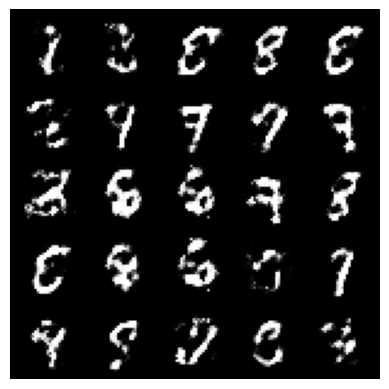

Epoch: 183/200 Steps:469	Epoch_Run_Time: 8.646651	Loss_D : 0.462313	Loss_G : 1.400601	
Epoch: 183/200 Total Steps:86296	Total_Time : 1633.124052
Loss_D : 0.462313	Loss_G : 1.400601
Loss_D_Mean : 0.462372	Loss_G_Mean : 1.360204


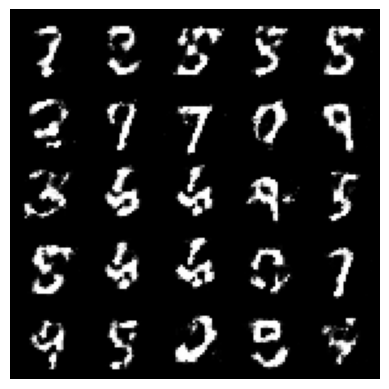

Epoch: 184/200 Steps:469	Epoch_Run_Time: 8.665098	Loss_D : 0.597684	Loss_G : 1.459713	
Epoch: 184/200 Total Steps:86765	Total_Time : 1641.865848
Loss_D : 0.597684	Loss_G : 1.459713
Loss_D_Mean : 0.462160	Loss_G_Mean : 1.390054


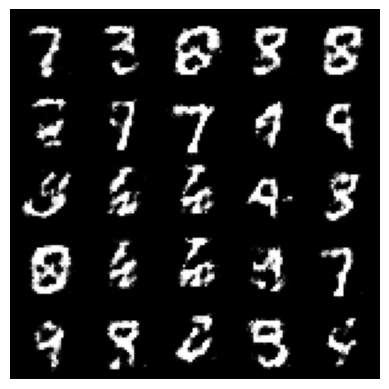

Epoch: 185/200 Steps:469	Epoch_Run_Time: 8.673214	Loss_D : 0.420623	Loss_G : 1.337823	
Epoch: 185/200 Total Steps:87234	Total_Time : 1650.612348
Loss_D : 0.420623	Loss_G : 1.337823
Loss_D_Mean : 0.459706	Loss_G_Mean : 1.354954


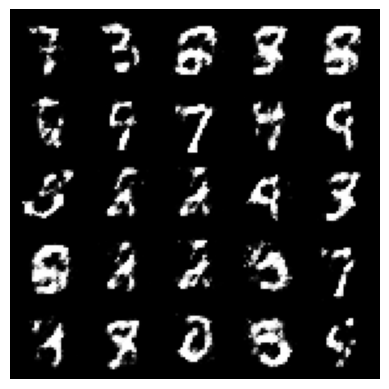

Epoch: 186/200 Steps:469	Epoch_Run_Time: 8.654160	Loss_D : 0.470683	Loss_G : 1.269233	
Epoch: 186/200 Total Steps:87703	Total_Time : 1659.340197
Loss_D : 0.470683	Loss_G : 1.269233
Loss_D_Mean : 0.452271	Loss_G_Mean : 1.411048


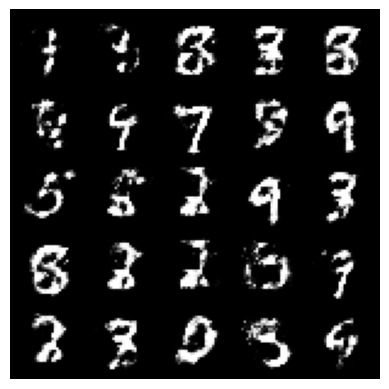

Epoch: 187/200 Steps:469	Epoch_Run_Time: 8.646669	Loss_D : 0.512898	Loss_G : 1.254432	
Epoch: 187/200 Total Steps:88172	Total_Time : 1668.055499
Loss_D : 0.512898	Loss_G : 1.254432
Loss_D_Mean : 0.470761	Loss_G_Mean : 1.362464


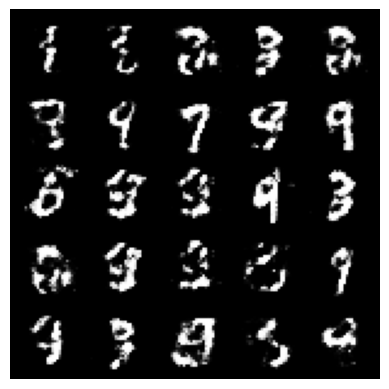

Epoch: 188/200 Steps:469	Epoch_Run_Time: 8.703638	Loss_D : 0.457303	Loss_G : 1.350728	
Epoch: 188/200 Total Steps:88641	Total_Time : 1676.835014
Loss_D : 0.457303	Loss_G : 1.350728
Loss_D_Mean : 0.478298	Loss_G_Mean : 1.323040


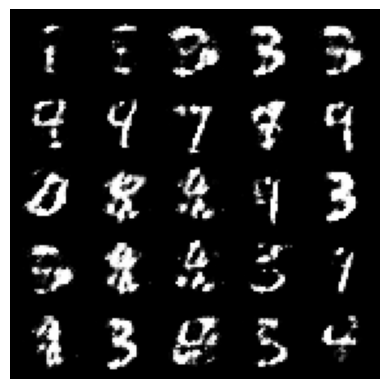

Epoch: 189/200 Steps:469	Epoch_Run_Time: 8.661522	Loss_D : 0.461754	Loss_G : 1.257665	
Epoch: 189/200 Total Steps:89110	Total_Time : 1685.568725
Loss_D : 0.461754	Loss_G : 1.257665
Loss_D_Mean : 0.466802	Loss_G_Mean : 1.347407


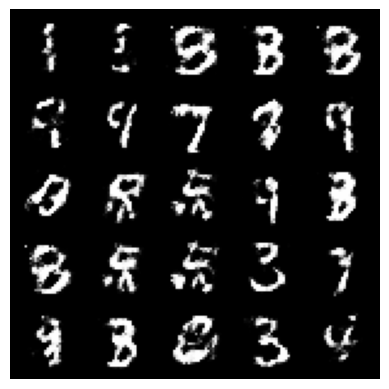

Epoch: 190/200 Steps:469	Epoch_Run_Time: 8.671796	Loss_D : 0.536119	Loss_G : 1.218598	
Epoch: 190/200 Total Steps:89579	Total_Time : 1694.312705
Loss_D : 0.536119	Loss_G : 1.218598
Loss_D_Mean : 0.492810	Loss_G_Mean : 1.304035


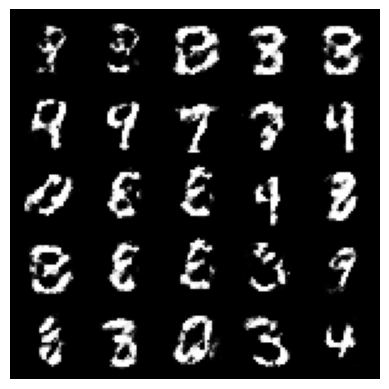

Epoch: 191/200 Steps:469	Epoch_Run_Time: 8.685505	Loss_D : 0.518260	Loss_G : 1.204620	
Epoch: 191/200 Total Steps:90048	Total_Time : 1703.073002
Loss_D : 0.518260	Loss_G : 1.204620
Loss_D_Mean : 0.478077	Loss_G_Mean : 1.297529


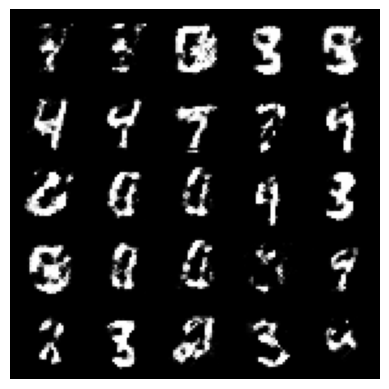

Epoch: 192/200 Steps:469	Epoch_Run_Time: 8.635104	Loss_D : 0.485178	Loss_G : 1.317058	
Epoch: 192/200 Total Steps:90517	Total_Time : 1711.780372
Loss_D : 0.485178	Loss_G : 1.317058
Loss_D_Mean : 0.498629	Loss_G_Mean : 1.253715


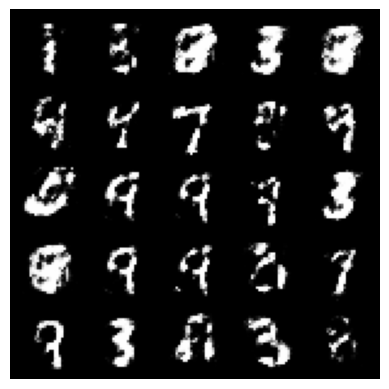

Epoch: 193/200 Steps:469	Epoch_Run_Time: 8.656611	Loss_D : 0.481084	Loss_G : 1.368142	
Epoch: 193/200 Total Steps:90986	Total_Time : 1720.510258
Loss_D : 0.481084	Loss_G : 1.368142
Loss_D_Mean : 0.489105	Loss_G_Mean : 1.278411


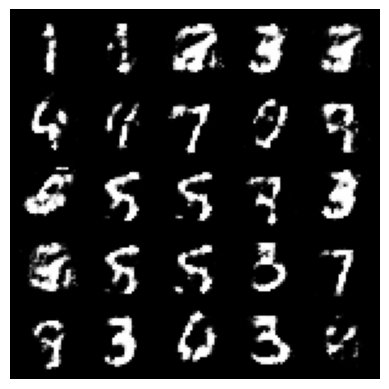

Epoch: 194/200 Steps:469	Epoch_Run_Time: 8.661726	Loss_D : 0.523912	Loss_G : 1.319326	
Epoch: 194/200 Total Steps:91455	Total_Time : 1729.251686
Loss_D : 0.523912	Loss_G : 1.319326
Loss_D_Mean : 0.495325	Loss_G_Mean : 1.276936


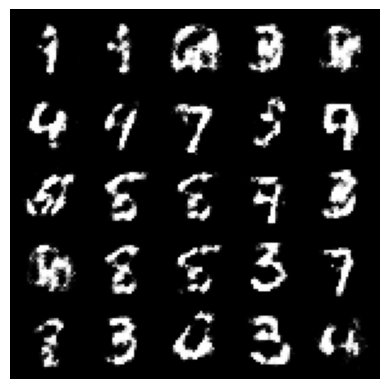

Epoch: 195/200 Steps:469	Epoch_Run_Time: 8.653951	Loss_D : 0.546935	Loss_G : 1.127720	
Epoch: 195/200 Total Steps:91924	Total_Time : 1737.990710
Loss_D : 0.546935	Loss_G : 1.127720
Loss_D_Mean : 0.531158	Loss_G_Mean : 1.171160


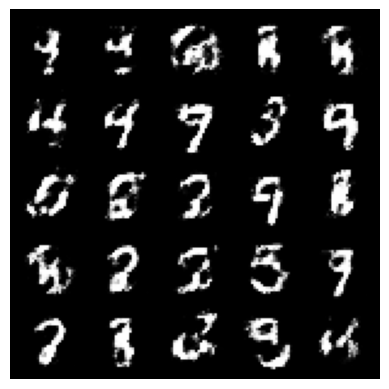

Epoch: 196/200 Steps:469	Epoch_Run_Time: 8.638575	Loss_D : 0.408161	Loss_G : 1.372534	
Epoch: 196/200 Total Steps:92393	Total_Time : 1746.710494
Loss_D : 0.408161	Loss_G : 1.372534
Loss_D_Mean : 0.492463	Loss_G_Mean : 1.250420


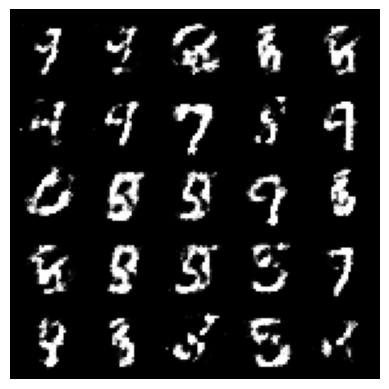

Epoch: 197/200 Steps:469	Epoch_Run_Time: 8.659204	Loss_D : 0.513913	Loss_G : 1.316561	
Epoch: 197/200 Total Steps:92862	Total_Time : 1755.444891
Loss_D : 0.513913	Loss_G : 1.316561
Loss_D_Mean : 0.488555	Loss_G_Mean : 1.260126


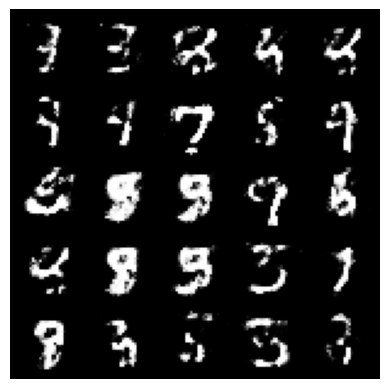

Epoch: 198/200 Steps:469	Epoch_Run_Time: 8.740371	Loss_D : 0.531205	Loss_G : 1.249083	
Epoch: 198/200 Total Steps:93331	Total_Time : 1764.259513
Loss_D : 0.531205	Loss_G : 1.249083
Loss_D_Mean : 0.477471	Loss_G_Mean : 1.248107


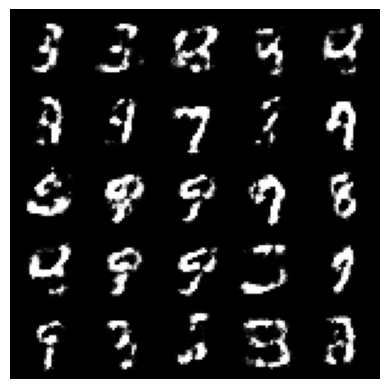

Epoch: 199/200 Steps:469	Epoch_Run_Time: 8.682700	Loss_D : 0.463751	Loss_G : 1.373884	
Epoch: 199/200 Total Steps:93800	Total_Time : 1773.012301
Loss_D : 0.463751	Loss_G : 1.373884
Loss_D_Mean : 0.456258	Loss_G_Mean : 1.320361


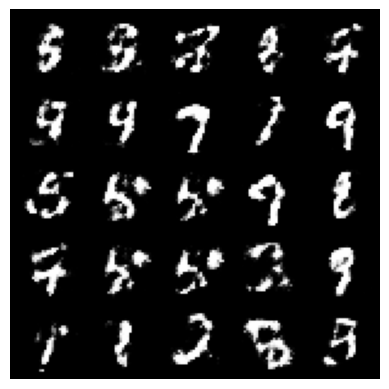

In [10]:
n_epochs = 200
cur_step = 0
mean_generator_loss = 0
total_steps = 0
start_time = time.time()
mean_discriminator_loss = 0
gen_loss = False

G_losses = []
D_losses = []
D_mean_losses = []
G_mean_losses = []


for epoch in range(n_epochs):
    cur_step = 0
    start = time.time()
    for real, _ in dataloader:
        
        cur_batch_size = len(real)

        # Flatten the batch of real images from the dataset
        real = real.view(cur_batch_size, -1).to(device)

        ## Update discriminator ##
        disc_opt.zero_grad()
        fake_noise = get_noise(cur_batch_size, z_dim, device=device)
        fake = gen(fake_noise)
        disc_fake_pred = disc(fake.detach())
        disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
        disc_real_pred = disc(real)
        disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))
        disc_loss = (disc_fake_loss + disc_real_loss) / 2
        
        disc_loss.backward(retain_graph=True)
        disc_opt.step()

        ## Update generator ##
        gen_opt.zero_grad()
        fake_noise_2 = get_noise(cur_batch_size, z_dim, device=device)
        fake_2 = gen(fake_noise_2)
        disc_fake_pred = disc(fake_2)
        gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))
        
        gen_loss.backward()
        gen_opt.step()


        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() 

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() 
        
        cur_step += 1
        total_steps += 1
        
        D_losses.append(disc_loss.item())
        G_losses.append(gen_loss.item())
        
        
        print_val = f"Epoch: {epoch}/{n_epochs} Steps:{cur_step}\t"
        print_val += f"Epoch_Run_Time: {(time.time()-start):.6f}\t"
        print_val += f"Loss_D : {disc_loss.item():.6f}\t"
        print_val += f"Loss_G : {gen_loss.item():.6f}\t"  
        print(print_val, end='\r',flush = True)
       
    
    print()
    loss_D_mean = mean_discriminator_loss / cur_step
    loss_G_mean = mean_generator_loss / cur_step
    print_val = f"Epoch: {epoch}/{n_epochs} Total Steps:{total_steps}\t"
    print_val += f"Total_Time : {(time.time() - start_time):.6f}\n"
    print_val += f"Loss_D : {disc_loss.item():.6f}\t"
    print_val += f"Loss_G : {gen_loss.item():.6f}\n"
    print_val += f"Loss_D_Mean : {loss_D_mean:.6f}\t"
    print_val += f"Loss_G_Mean : {loss_G_mean:.6f}\n"
    print(print_val, end='\r',flush = True)
    
    D_mean_losses.append(loss_D_mean)
    G_mean_losses.append(loss_G_mean)
    
    fake_noise = fixed_noise
    fake = gen(fake_noise)
    show_tensor_images(fake, show_fig=True,epoch=epoch)
    mean_generator_loss = 0
    mean_discriminator_loss = 0

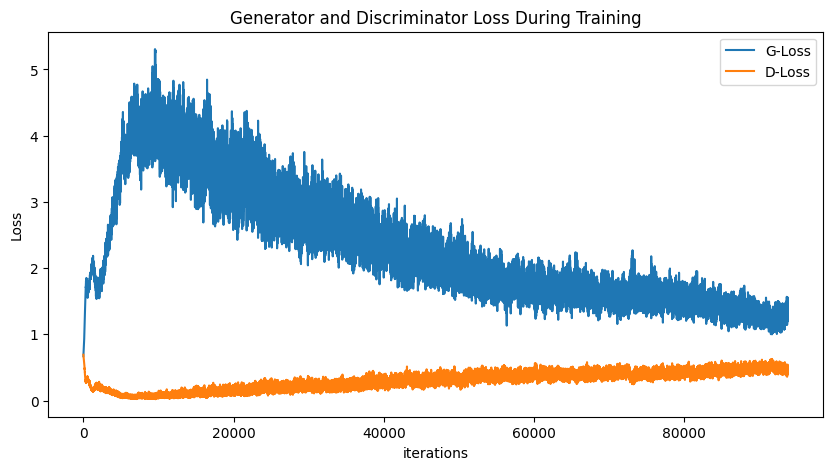

In [11]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G-Loss")
plt.plot(D_losses,label="D-Loss")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

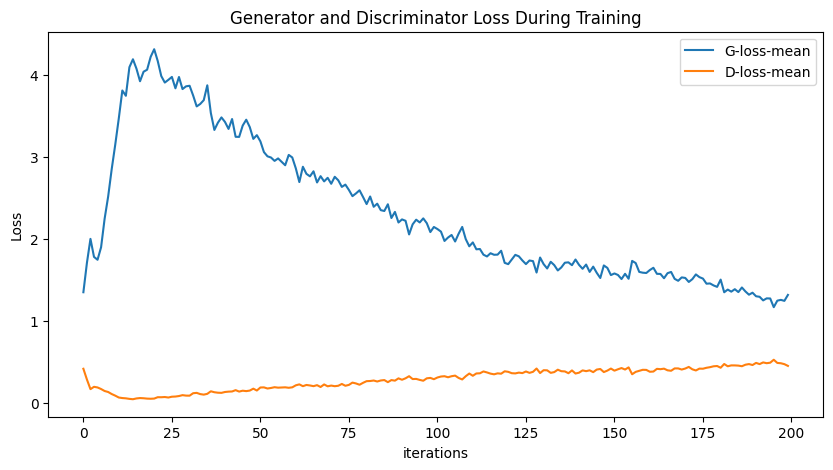

In [12]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_mean_losses,label="G-loss-mean")
plt.plot(D_mean_losses,label="D-loss-mean")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

In [13]:
anim_file = 'Vanilla-GAN.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob.glob('image*.png')
  filenames = sorted(filenames)
  for filename in filenames:
    image = imageio.imread(filename)
    writer.append_data(image)
  image = imageio.imread(filename)
  writer.append_data(image)


!pip install -q git+https://github.com/tensorflow/docs
import tensorflow_docs.vis.embed as embed
embed.embed_file(anim_file)

NameError: name 'filename' is not defined

In [ ]:
def show_new_gen_images(tensor_img, num_img=25):
    tensor_img = (tensor_img + 1) / 2
    unflat_img = tensor_img.detach().cpu()
    img_grid = make_grid(unflat_img[:num_img], nrow=5)
    plt.imshow(img_grid.permute(1, 2, 0).squeeze(),cmap='gray')
    plt.show()

num_image = 25
noise = get_noise(num_image, z_dim, device=device)
with torch.no_grad():
    fake_img = gen(noise)

show_new_gen_images(fake_img.reshape(num_image,1,28,28))